"Setup" and "Pre-Process" sections are omitted.
This notebook is **not** excecutable since the dataset used is not public.




## TLDR

In the round of "traditional" clustering, AgglomerativeClustering with clusters=4 after 1) removing features above correlation 0.9; 2) Generating polynomial features; 3) Applying PCA (0.95); 4) Removing outlier clusters.

Algorithms used for Deep Learning Clustering:<br>
Autoencoder, Variational Autoencoder, ClusterGAN, Deep Clustering Network

Deep Clustering Network has showed best scores in both K=3 and 4 (0.909 & 0.683).
No further hyperparameter tuning has not been done because an Autoencoder model has been chosen for the presentation.


# "Traditional" (non-Deep Learning) Clustering

## Functions:

In [ ]:
# PCA
def get_pca(df):

  from sklearn.decomposition import PCA

  visit_occurrence_id = df['visit_occurrence_id']

  # Initialize PCA, retaining 95% of the variance
  pca = PCA(n_components=0.95)

  # Fit and transform the scaled data
  pca_result = pca.fit_transform(df.drop(columns=['visit_occurrence_id']))

  # Create a DataFrame with the PCA results
  pca_columns = [f'PC{i+1}' for i in range(pca_result.shape[1])]
  df_pca = pd.DataFrame(pca_result, columns=pca_columns)
  df_pca['visit_occurrence_id'] = visit_occurrence_id.values

  return df_pca


# Function to calculate the average silhouette score for a given number of clusters
def find_best_k(data, max_clusters):
    best_k = 2
    best_score = -1
    for k in range(2, max_clusters + 1):
        kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
        cluster_labels = kmeans.fit_predict(data)
        silhouette_avg = silhouette_score(data, cluster_labels)
        print(f'For n_clusters = {k}, the average silhouette_score is {silhouette_avg}')
        if silhouette_avg > best_score:
            best_score = silhouette_avg
            best_k = k
    return best_k


# Feature Importance

# Polynomial

# K-Means

# Hierachical

# DBSCAN

# K-medoids


## 1: PCA + Clustering

### PCA

In [ ]:
data_clean_pca = get_pca(data_clean_scaled)
data_deep_pca = get_pca(data_deep_scaled)
data_no_miss_50_pca = get_pca(data_no_miss_50_scaled)
data_no_miss_80_pca = get_pca(data_no_miss_80_scaled)

### K-means

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Drop the visit_occurrence_id column for clustering
data_for_clustering = data_clean_pca.drop(columns=['visit_occurrence_id'])

from sklearn.metrics import silhouette_score

# Finding the best k using silhouette score
best_k = find_best_k(data_for_clustering, 10)
best_k

For n_clusters = 2, the average silhouette_score is 0.10524440211218347
For n_clusters = 3, the average silhouette_score is 0.08191098416918281
For n_clusters = 4, the average silhouette_score is 0.03699088099573391
For n_clusters = 5, the average silhouette_score is 0.040449877534903186
For n_clusters = 6, the average silhouette_score is 0.049919820954387954
For n_clusters = 7, the average silhouette_score is 0.03955255715331464
For n_clusters = 8, the average silhouette_score is 0.04890685962377663
For n_clusters = 9, the average silhouette_score is 0.028107483752388793
For n_clusters = 10, the average silhouette_score is 0.04256792335465611


2

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Drop the visit_occurrence_id column for clustering
data_for_clustering = data_deep_pca.drop(columns=['visit_occurrence_id'])

from sklearn.metrics import silhouette_score

# Finding the best k using silhouette score
best_k = find_best_k(data_for_clustering, 10)
best_k

For n_clusters = 2, the average silhouette_score is 0.09821406195357218
For n_clusters = 3, the average silhouette_score is 0.0780018769623455
For n_clusters = 4, the average silhouette_score is 0.08414589147045128
For n_clusters = 5, the average silhouette_score is 0.045622645699714366
For n_clusters = 6, the average silhouette_score is 0.07560181763755024
For n_clusters = 7, the average silhouette_score is 0.05031220454104456
For n_clusters = 8, the average silhouette_score is 0.04892968447909686
For n_clusters = 9, the average silhouette_score is 0.04971152262691197
For n_clusters = 10, the average silhouette_score is 0.04682036640229417


2

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Drop the visit_occurrence_id column for clustering
data_for_clustering = data_no_miss_50_pca.drop(columns=['visit_occurrence_id'])

from sklearn.metrics import silhouette_score

# Finding the best k using silhouette score
best_k = find_best_k(data_for_clustering, 10)
best_k

For n_clusters = 2, the average silhouette_score is 0.10864725349688108
For n_clusters = 3, the average silhouette_score is 0.10115107587314905
For n_clusters = 4, the average silhouette_score is 0.05943861772827126
For n_clusters = 5, the average silhouette_score is 0.06183829275339529
For n_clusters = 6, the average silhouette_score is 0.06395776955450733
For n_clusters = 7, the average silhouette_score is 0.05791203245916664
For n_clusters = 8, the average silhouette_score is 0.07132441880555815
For n_clusters = 9, the average silhouette_score is 0.05736813817516407
For n_clusters = 10, the average silhouette_score is 0.06222665725386636


2

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Drop the visit_occurrence_id column for clustering
data_for_clustering = data_no_miss_80_pca.drop(columns=['visit_occurrence_id'])

from sklearn.metrics import silhouette_score

# Finding the best k using silhouette score
best_k = find_best_k(data_for_clustering, 10)
best_k

For n_clusters = 2, the average silhouette_score is 0.11506085005555398
For n_clusters = 3, the average silhouette_score is 0.09481004983305216
For n_clusters = 4, the average silhouette_score is 0.04634417173918703
For n_clusters = 5, the average silhouette_score is 0.05038278483785703
For n_clusters = 6, the average silhouette_score is 0.045402560917030446
For n_clusters = 7, the average silhouette_score is 0.047469727817375774
For n_clusters = 8, the average silhouette_score is 0.045876641875663
For n_clusters = 9, the average silhouette_score is 0.057597414441970564
For n_clusters = 10, the average silhouette_score is 0.05824636362169146


2

In [ ]:
from sklearn.cluster import KMeans

# Initialize KMeans with 3 clusters
kmeans = KMeans(n_clusters=3, random_state=42)

# Fit KMeans on the PCA results
clusters = kmeans.fit(data_no_miss_50_pca.drop(columns=['visit_occurrence_id']))

# Add the cluster labels to the PCA DataFrame
data_no_miss_50_pca['cluster'] = kmeans.labels_

data_no_miss_50_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,visit_occurrence_id,cluster
0,-2.965,-0.885,1.307,-0.043,-2.356,-0.536,4.037,0.411,-1.987,1.160,0.854,0.653,-1.286,1.309,0.185,-1.141,1.032,0.200,0.107,-0.476,0.863,-0.125,0.910,0.487,-0.299,-0.019,-0.566,-0.400,0.068,0.119,-0.279,-0.477,-0.573,0.421,0.247,0.159,-0.058,-0.657,0.402,-0.103,0.197,-0.294,0.007,0.177,0.007,4,2
1,-2.906,0.543,1.239,-0.623,-1.015,1.980,-2.107,3.107,-0.205,-0.577,1.322,0.153,0.369,1.071,-0.214,-0.708,0.172,-0.099,0.139,-0.369,-0.957,0.121,-0.472,-0.173,0.019,-0.072,0.590,0.738,-0.097,-0.318,-0.829,-0.866,-0.000,-0.364,-1.531,-0.248,1.270,-0.099,-0.627,0.410,0.208,-0.345,0.144,0.325,1.159,15,2
2,-1.633,-0.756,-0.346,1.123,-2.008,-1.840,-2.190,0.645,1.561,-0.412,-1.126,1.055,0.151,-1.507,0.384,0.081,0.012,0.299,-1.028,0.312,1.065,0.461,-0.475,0.102,0.149,0.267,0.070,0.090,-0.469,0.221,0.571,1.233,0.008,-0.801,0.520,-0.237,-0.908,-0.097,-0.648,-0.630,0.202,-0.305,0.142,0.280,0.173,32,2
3,0.909,-1.413,-3.274,-0.655,-1.482,0.400,-0.159,-2.609,-1.536,0.834,-0.165,-1.598,0.805,0.672,0.772,-0.277,-0.769,-0.762,-0.347,0.574,-0.964,-0.239,-1.418,0.778,0.354,-0.835,0.377,-0.556,-0.308,-0.015,1.098,-0.478,0.410,-1.154,0.575,-0.433,-0.496,1.262,0.873,-0.433,-0.261,-0.676,-0.057,0.223,0.854,47,1
4,4.259,1.683,-0.725,0.397,-1.382,0.575,0.862,1.314,1.081,-1.120,1.005,-0.623,-1.409,-2.788,-0.447,1.714,-1.212,0.687,-2.709,0.221,-0.632,-0.075,0.455,-0.598,0.627,0.293,0.901,-0.317,1.101,-0.880,-0.069,1.559,-0.254,-0.427,0.038,1.524,1.385,0.396,1.152,0.042,0.474,1.685,-0.632,-1.550,1.118,50,0


In [ ]:
# Add the original scaled data back to the PCA DataFrame for profiling
cluster_profile_df = data_no_miss_50_scaled.copy()
cluster_profile_df['cluster'] = data_no_miss_50_pca['cluster']

# Calculate the mean values of each feature for each cluster
cluster_profile = cluster_profile_df.groupby('cluster').mean()

# Display the cluster profile
cluster_profile

,urine_output_per_kg_avg_roll_6hr,urine_output_per_kg_avg_roll_12hr,urine_output_per_kg_avg_roll_24hr,highest_scr,first_scr,is_medical_admission,is_planned_surgery_admission,is_emergency_surgery_admission,is_acute_admission,is_elective_admission,is_deceased_before_admission,is_type_1_diabetes,is_hypertension,is_coronary_artery_disease,is_heart_disease,is_heart_failure,is_cancer,is_type2_diabetes,map,days_admit_to_first_vent,days_vent_param,is_blood_product,is_antibiotic_not,crystalloid,is_synthetic_colloid,is_albumin,norepinephrine,hemoglobin_moles_volume_in_blood,hematocrit_pure_volume_fraction_of_blood_by_automated_count,potassium_moles_volume_in_serum_or_plasma,potassium_moles_volume_in_blood,urea_moles_volume_in_blood,ph_of_blood,lactate_moles_volume_in_blood,bicarbonate_moles_volume_in_blood,sodium_moles_volume_in_blood,sodium_moles_volume_in_serum_or_plasma,glucose_moles_volume_in_blood,creatine_kinase_enzymatic_activity_volume_in_serum_or_plasma,bilirubin_total_moles_volume_in_serum_or_plasma,albumin_mass_volume_in_serum_or_plasma,oxygen_partial_pressure_in_blood,length_of_stay,is_cardiovascular_surgery,is_gastrointestinal_surgery,is_general_surgery,is_sepsis,is_traumatic_injury,is_vascular_surgery,age,height,weight,bmi,is_female,is_male,is_other_sex,is_rrt_in_7_days,mv_days,platelets,leukocytes,max_CRP,amphotericin,colistin,is_rrt,is_death,kdigo_1,kdigo_2,kdigo_3,is_mv,visit_occurrence_id
cluster,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,-0.029,-0.026,-0.022,0.042,-0.123,-0.157,-0.135,-0.055,0.047,0.041,0.000,0.000,0.000,-0.107,0.000,0.000,0.006,0.001,0.143,0.155,1.898,0.603,0.402,1.700,0.349,0.945,0.787,-0.128,-0.259,-0.200,-0.114,0.056,0.149,-0.185,0.298,0.140,0.145,-0.170,-0.120,-0.033,-0.207,-0.126,1.895,-0.177,0.093,-0.025,0.089,-0.045,-0.036,0.091,-0.061,-0.070,-0.049,0.015,-0.087,0.227,0.121,1.866,0.063,-0.106,0.366,1.788,1.781,0.308,0.226,-0.276,-0.050,0.319,0.220,11785.065
1,-0.860,-0.844,-0.806,0.741,0.563,0.054,-0.156,-0.037,0.098,0.021,0.000,0.000,0.000,-0.122,0.000,0.000,0.103,0.019,-0.041,-0.033,-0.185,0.297,0.005,-0.133,0.057,0.192,0.183,-0.022,0.014,0.346,0.313,0.428,-0.308,0.506,-0.365,-0.052,0.003,0.209,0.199,0.307,-0.192,-0.021,-0.217,-0.037,-0.022,-0.036,0.127,-0.078,0.072,-0.091,0.053,0.063,0.030,0.001,0.010,-0.034,1.132,-0.188,-0.145,0.123,0.108,-0.170,-0.169,1.106,0.179,-0.880,-0.380,1.186,0.081,11783.599
2,0.440,0.432,0.412,-0.383,-0.257,0.007,0.109,0.031,-0.060,-0.020,0.000,0.000,0.000,0.085,0.000,0.000,-0.053,-0.010,-0.011,-0.018,-0.328,-0.284,-0.092,-0.310,-0.106,-0.307,-0.267,0.039,0.050,-0.130,-0.132,-0.229,0.122,-0.214,0.118,-0.005,-0.034,-0.068,-0.074,-0.147,0.143,0.039,-0.311,0.058,-0.010,0.024,-0.084,0.049,-0.028,0.025,-0.013,-0.016,-0.004,-0.004,0.014,-0.033,-0.598,-0.320,0.059,-0.039,-0.136,-0.312,-0.310,-0.627,-0.141,0.505,0.203,-0.670,-0.089,11855.309


In [ ]:
# Get the distribution of clusters
cluster_distribution = data_no_miss_50_pca['cluster'].value_counts().sort_index()

# Convert the distribution to a DataFrame for display
cluster_distribution_df = cluster_distribution.reset_index()
cluster_distribution_df.columns = ['cluster', 'count']

# Display the cluster distribution
cluster_distribution_df

,cluster,count
0,0,308
1,1,700
2,2,1387


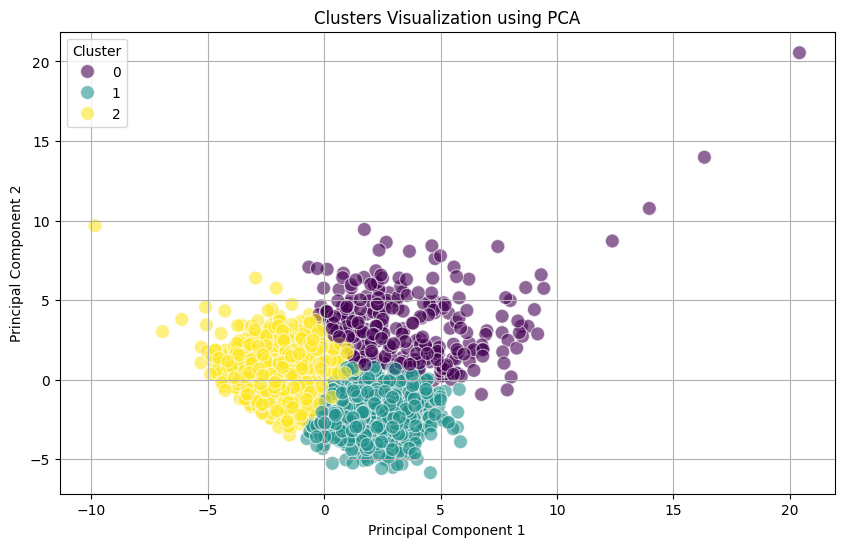

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a scatter plot of the clusters using the first two principal components
plt.figure(figsize=(10, 6))

# Scatter plot for each cluster
sns.scatterplot(data=data_no_miss_50_pca, x='PC1', y='PC2', hue='cluster', palette='viridis', s=100, alpha=0.6, edgecolor='w')

# Add title and labels
plt.title('Clusters Visualization using PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.grid(True)

# Show the plot
plt.show()

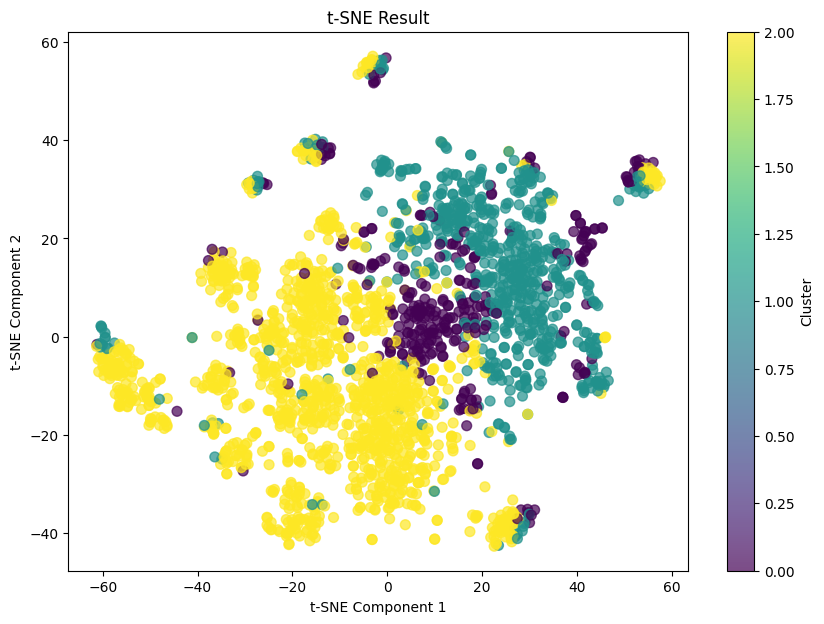

In [ ]:
from sklearn.manifold import TSNE

# Apply t-SNE to reduce the data to 2 dimensions
tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(data_no_miss_50_scaled.drop(columns=['visit_occurrence_id']))

# Plot the t-SNE results
plt.figure(figsize=(10, 7))
plt.scatter(tsne_result[:, 0], tsne_result[:, 1], c=data_no_miss_50_pca['cluster'], cmap='viridis', s=50, alpha=0.7)
plt.colorbar(label='Cluster')
plt.title('t-SNE Result')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

In [ ]:
from sklearn.metrics import silhouette_score

sil_score = silhouette_score(data_no_miss_50_pca.drop(columns=['visit_occurrence_id', 'cluster']), data_no_miss_50_pca['cluster'])
print(f'Silhouette Score: {sil_score}')

Silhouette Score: 0.10115107587314905


### Hierarchical

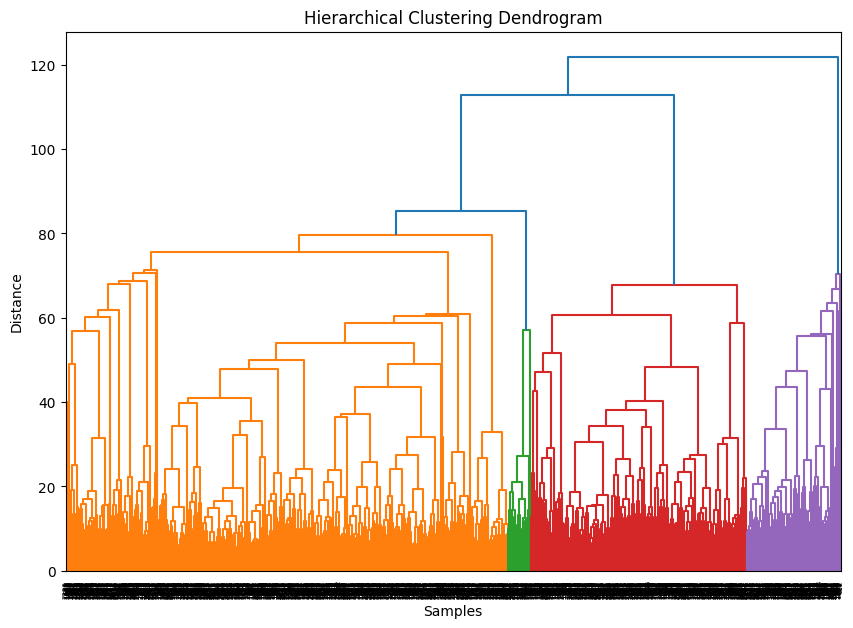

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt

# Perform hierarchical clustering using the linkage method
linked = linkage(data_clean_pca.drop(columns=['visit_occurrence_id']), method='ward')

# Plot the dendrogram
plt.figure(figsize=(10, 7))
dendrogram(linked,
            orientation='top',
            distance_sort='descending',
            show_leaf_counts=False)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Samples')
plt.ylabel('Distance')
plt.show()


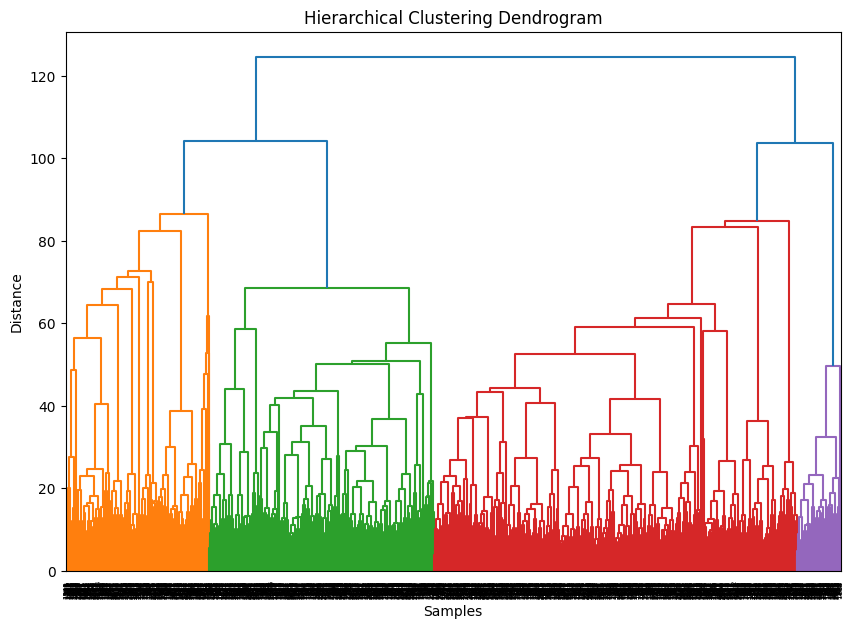

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt

# Perform hierarchical clustering using the linkage method
linked = linkage(data_deep_pca.drop(columns=['visit_occurrence_id']), method='ward')

# Plot the dendrogram
plt.figure(figsize=(10, 7))
dendrogram(linked,
            orientation='top',
            distance_sort='descending',
            show_leaf_counts=False)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Samples')
plt.ylabel('Distance')
plt.show()


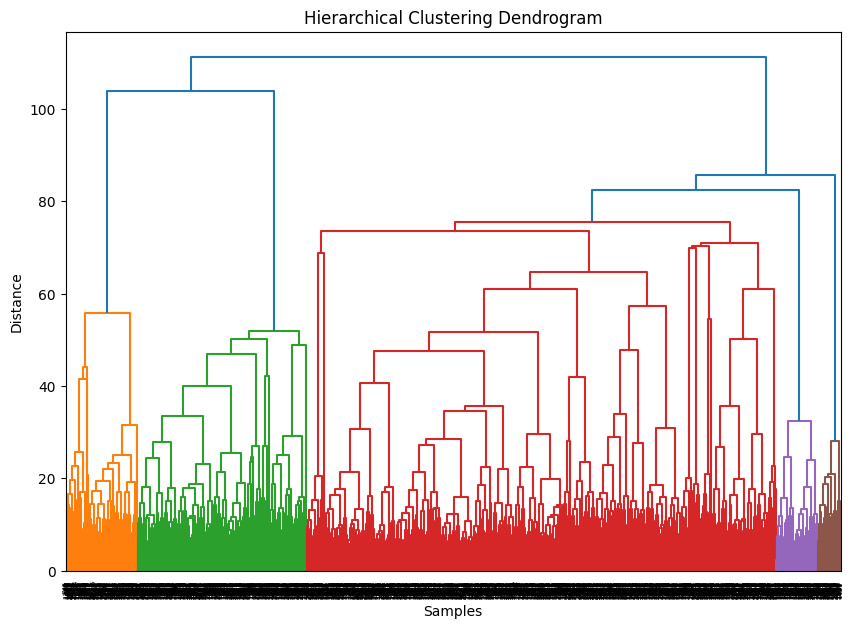

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt

# Perform hierarchical clustering using the linkage method
linked = linkage(data_no_miss_50_pca.drop(columns=['visit_occurrence_id', 'cluster']), method='ward')

# Plot the dendrogram
plt.figure(figsize=(10, 7))
dendrogram(linked,
            orientation='top',
            distance_sort='descending',
            show_leaf_counts=False)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Samples')
plt.ylabel('Distance')
plt.show()


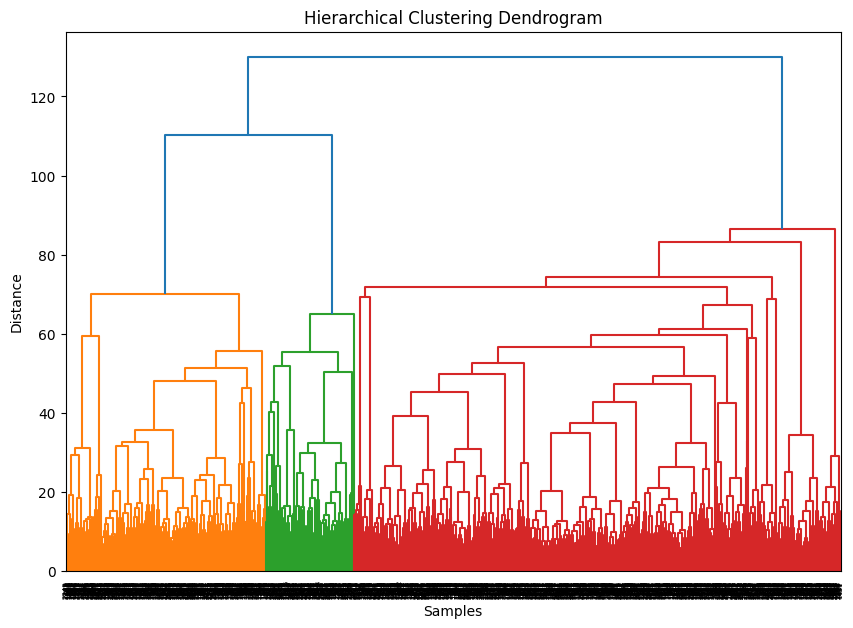

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt

# Perform hierarchical clustering using the linkage method
linked = linkage(data_no_miss_80_pca.drop(columns=['visit_occurrence_id']), method='ward')

# Plot the dendrogram
plt.figure(figsize=(10, 7))
dendrogram(linked,
            orientation='top',
            distance_sort='descending',
            show_leaf_counts=False)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Samples')
plt.ylabel('Distance')
plt.show()


In [ ]:
from scipy.cluster.hierarchy import fcluster

# Extract clusters from the hierarchical clustering with the number of clusters set to 3
hierarchical_clusters = fcluster(linked, 5, criterion='maxclust')

# Add the cluster labels to the PCA DataFrame
data_no_miss_50_pca['hierarchical_cluster'] = hierarchical_clusters


# Display the first few rows of the PCA DataFrame with new clusters
data_no_miss_50_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,visit_occurrence_id,cluster,hierarchical_cluster
0,-2.965,-0.885,1.307,-0.043,-2.356,-0.536,4.037,0.411,-1.987,1.160,0.854,0.653,-1.286,1.309,0.185,-1.141,1.032,0.200,0.107,-0.476,0.863,-0.125,0.910,0.487,-0.299,-0.019,-0.566,-0.400,0.068,0.119,-0.279,-0.477,-0.573,0.421,0.247,0.159,-0.058,-0.657,0.402,-0.103,0.197,-0.294,0.007,0.177,0.007,4,2,2
1,-2.906,0.543,1.239,-0.623,-1.015,1.980,-2.107,3.107,-0.205,-0.577,1.322,0.153,0.369,1.071,-0.214,-0.708,0.172,-0.099,0.139,-0.369,-0.957,0.121,-0.472,-0.173,0.019,-0.072,0.590,0.738,-0.097,-0.318,-0.829,-0.866,-0.000,-0.364,-1.531,-0.248,1.270,-0.099,-0.627,0.410,0.208,-0.345,0.144,0.325,1.159,15,2,3
2,-1.633,-0.756,-0.346,1.123,-2.008,-1.840,-2.190,0.645,1.561,-0.412,-1.126,1.055,0.151,-1.507,0.384,0.081,0.012,0.299,-1.028,0.312,1.065,0.461,-0.475,0.102,0.149,0.267,0.070,0.090,-0.469,0.221,0.571,1.233,0.008,-0.801,0.520,-0.237,-0.908,-0.097,-0.648,-0.630,0.202,-0.305,0.142,0.280,0.173,32,2,3
3,0.909,-1.413,-3.274,-0.655,-1.482,0.400,-0.159,-2.609,-1.536,0.834,-0.165,-1.598,0.805,0.672,0.772,-0.277,-0.769,-0.762,-0.347,0.574,-0.964,-0.239,-1.418,0.778,0.354,-0.835,0.377,-0.556,-0.308,-0.015,1.098,-0.478,0.410,-1.154,0.575,-0.433,-0.496,1.262,0.873,-0.433,-0.261,-0.676,-0.057,0.223,0.854,47,1,4
4,4.259,1.683,-0.725,0.397,-1.382,0.575,0.862,1.314,1.081,-1.120,1.005,-0.623,-1.409,-2.788,-0.447,1.714,-1.212,0.687,-2.709,0.221,-0.632,-0.075,0.455,-0.598,0.627,0.293,0.901,-0.317,1.101,-0.880,-0.069,1.559,-0.254,-0.427,0.038,1.524,1.385,0.396,1.152,0.042,0.474,1.685,-0.632,-1.550,1.118,50,0,5


In [ ]:
# Add the original scaled data back to the PCA DataFrame for profiling
cluster_profile_df_hierarchical = data_no_miss_50_scaled.copy()
cluster_profile_df_hierarchical['hierarchical_cluster'] = data_no_miss_50_pca['hierarchical_cluster']

# Calculate the mean values of each feature for each cluster
cluster_profile_hierarchical = cluster_profile_df_hierarchical.groupby('hierarchical_cluster').mean()


# Display the cluster profile
cluster_profile_hierarchical

,urine_output_per_kg_avg_roll_6hr,urine_output_per_kg_avg_roll_12hr,urine_output_per_kg_avg_roll_24hr,highest_scr,first_scr,is_medical_admission,is_planned_surgery_admission,is_emergency_surgery_admission,is_acute_admission,is_elective_admission,is_deceased_before_admission,is_type_1_diabetes,is_hypertension,is_coronary_artery_disease,is_heart_disease,is_heart_failure,is_cancer,is_type2_diabetes,map,days_admit_to_first_vent,days_vent_param,is_blood_product,is_antibiotic_not,crystalloid,is_synthetic_colloid,is_albumin,norepinephrine,hemoglobin_moles_volume_in_blood,hematocrit_pure_volume_fraction_of_blood_by_automated_count,potassium_moles_volume_in_serum_or_plasma,potassium_moles_volume_in_blood,urea_moles_volume_in_blood,ph_of_blood,lactate_moles_volume_in_blood,bicarbonate_moles_volume_in_blood,sodium_moles_volume_in_blood,sodium_moles_volume_in_serum_or_plasma,glucose_moles_volume_in_blood,creatine_kinase_enzymatic_activity_volume_in_serum_or_plasma,bilirubin_total_moles_volume_in_serum_or_plasma,albumin_mass_volume_in_serum_or_plasma,oxygen_partial_pressure_in_blood,length_of_stay,is_cardiovascular_surgery,is_gastrointestinal_surgery,is_general_surgery,is_sepsis,is_traumatic_injury,is_vascular_surgery,age,height,weight,bmi,is_female,is_male,is_other_sex,is_rrt_in_7_days,mv_days,platelets,leukocytes,max_CRP,amphotericin,colistin,is_rrt,is_death,kdigo_1,kdigo_2,kdigo_3,is_mv,visit_occurrence_id
hierarchical_cluster,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,0.354,0.339,0.321,-0.187,-0.275,0.061,-0.266,0.779,-0.160,-0.122,0.000,0.000,0.000,-0.262,0.000,0.000,-0.239,-0.098,0.014,0.020,-0.046,-0.096,-0.046,0.011,-0.421,-0.156,-0.256,0.027,0.078,0.295,0.199,-0.414,-0.315,0.236,-0.177,0.269,0.224,-0.154,0.111,-0.071,0.173,0.315,0.040,0.150,-0.132,4.205,-0.282,5.474,-0.164,-0.899,0.384,-0.033,-0.268,-0.314,0.359,-0.156,-0.224,-0.049,-0.354,-0.211,-0.554,0.216,0.217,-0.281,-0.587,0.240,-0.011,-0.237,-0.215,12009.729
2,0.190,0.169,0.129,-0.423,-0.355,-0.527,3.763,-0.316,-0.273,-0.122,0.000,0.000,0.000,1.567,0.000,0.000,0.311,-0.098,-0.069,-0.098,-0.610,-0.397,0.117,-0.456,-1.297,-0.305,-0.315,0.077,0.279,0.471,0.602,-0.287,-0.159,-0.184,0.057,-0.170,-0.263,0.005,-0.152,-0.183,0.198,-0.010,-0.558,2.042,-0.132,-0.078,-0.322,-0.177,-0.194,0.197,-0.201,-0.016,0.114,-0.100,0.148,-0.156,-0.418,-0.591,-0.100,0.135,-0.349,-0.491,-0.489,-0.418,-0.784,0.415,0.068,-0.476,0.060,11127.357
3,0.214,0.211,0.204,-0.189,-0.147,0.049,-0.221,0.097,0.064,0.079,0.000,0.000,0.000,-0.065,0.000,0.000,-0.004,0.064,0.021,-0.002,-0.210,-0.154,-0.067,-0.182,-0.002,-0.159,-0.167,-0.009,0.020,-0.121,-0.125,-0.134,0.095,-0.136,0.070,-0.018,-0.030,-0.053,0.036,-0.103,0.069,0.030,-0.198,-0.063,0.086,-0.136,0.016,-0.157,0.137,0.031,0.018,-0.005,-0.016,-0.004,-0.024,0.088,-0.306,-0.207,0.065,-0.062,-0.017,-0.198,-0.197,-0.324,-0.006,0.249,0.122,-0.347,-0.054,12012.401
4,-0.740,-0.726,-0.692,0.739,0.615,0.089,-0.243,-0.256,-0.100,-0.122,0.000,0.000,0.000,-0.145,0.000,0.000,-0.027,-0.098,-0.039,-0.045,-0.077,0.306,-0.010,-0.051,0.199,0.204,0.266,0.055,-0.035,0.300,0.269,0.522,-0.277,0.509,-0.363,0.002,0.060,0.256,0.001,0.370,-0.210,-0.112,-0.144,-0.266,-0.132,-0.134,0.136,-0.177,-0.221,-0.087,0.008,0.056,0.048,0.021,0.021,-0.131,1.029,-0.077,-0.109,0.227,0.140,-0.115,-0.118,1.035,0.207,-0.832,-0.345,1.110,0.071,11270.235
5,0.124,0.123,0.122,-0.201,-0.195,-0.243,-0.084,-0.096,0.029,-0.122,0.000,0.000,0.000,-0.059,0.000,0.000,-0.019,-0.098,-0.012,0.172,1.927,0.545,0.407,1.570,0.432,0.786,0.731,-0.122,-0.238,-0.281,-0.228,-0.054,0.226,-0.277,0.418,0.127,0.141,-0.213,-0.184,-0.068,-0.122,-0.028,1.943,-0.194,-0.132,-0.075,-0.148,-0.177,-0.209,0.169,-0.141,-0.080,0.011,0.132,-0.090,-0.127,-0.113,1.894,-0.002,-0.142,0.156,1.784,1.783,0.013,0.191,0.015,-0.022,0.002,0.214,12257.635


In [ ]:
# Get the distribution of hierarchical clusters
hierarchical_cluster_distribution = data_no_miss_50_pca['hierarchical_cluster'].value_counts().sort_index()

# Convert the distribution to a DataFrame for display
hierarchical_cluster_distribution = hierarchical_cluster_distribution.reset_index()
hierarchical_cluster_distribution.columns = ['hierarchical_cluster', 'count']


# Display the cluster distribution
hierarchical_cluster_distribution


,hierarchical_cluster,count
0,1,70
1,2,129
2,3,1451
3,4,523
4,5,222


In [ ]:
data_no_miss_50_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,visit_occurrence_id,cluster,hierarchical_cluster
0,-2.965,-0.885,1.307,-0.043,-2.356,-0.536,4.037,0.411,-1.987,1.160,0.854,0.653,-1.286,1.309,0.185,-1.141,1.032,0.200,0.107,-0.476,0.863,-0.125,0.910,0.487,-0.299,-0.019,-0.566,-0.400,0.068,0.119,-0.279,-0.477,-0.573,0.421,0.247,0.159,-0.058,-0.657,0.402,-0.103,0.197,-0.294,0.007,0.177,0.007,4,2,2
1,-2.906,0.543,1.239,-0.623,-1.015,1.980,-2.107,3.107,-0.205,-0.577,1.322,0.153,0.369,1.071,-0.214,-0.708,0.172,-0.099,0.139,-0.369,-0.957,0.121,-0.472,-0.173,0.019,-0.072,0.590,0.738,-0.097,-0.318,-0.829,-0.866,-0.000,-0.364,-1.531,-0.248,1.270,-0.099,-0.627,0.410,0.208,-0.345,0.144,0.325,1.159,15,2,3
2,-1.633,-0.756,-0.346,1.123,-2.008,-1.840,-2.190,0.645,1.561,-0.412,-1.126,1.055,0.151,-1.507,0.384,0.081,0.012,0.299,-1.028,0.312,1.065,0.461,-0.475,0.102,0.149,0.267,0.070,0.090,-0.469,0.221,0.571,1.233,0.008,-0.801,0.520,-0.237,-0.908,-0.097,-0.648,-0.630,0.202,-0.305,0.142,0.280,0.173,32,2,3
3,0.909,-1.413,-3.274,-0.655,-1.482,0.400,-0.159,-2.609,-1.536,0.834,-0.165,-1.598,0.805,0.672,0.772,-0.277,-0.769,-0.762,-0.347,0.574,-0.964,-0.239,-1.418,0.778,0.354,-0.835,0.377,-0.556,-0.308,-0.015,1.098,-0.478,0.410,-1.154,0.575,-0.433,-0.496,1.262,0.873,-0.433,-0.261,-0.676,-0.057,0.223,0.854,47,1,4
4,4.259,1.683,-0.725,0.397,-1.382,0.575,0.862,1.314,1.081,-1.120,1.005,-0.623,-1.409,-2.788,-0.447,1.714,-1.212,0.687,-2.709,0.221,-0.632,-0.075,0.455,-0.598,0.627,0.293,0.901,-0.317,1.101,-0.880,-0.069,1.559,-0.254,-0.427,0.038,1.524,1.385,0.396,1.152,0.042,0.474,1.685,-0.632,-1.550,1.118,50,0,5


In [ ]:
from sklearn.metrics import silhouette_score

silhouette_hierarchical = silhouette_score(data_no_miss_50_pca.drop(columns=['visit_occurrence_id', 'cluster', 'hierarchical_cluster']), data_no_miss_50_pca['hierarchical_cluster'])

silhouette_hierarchical


0.049753861081424294

## 2: Feature Importance + PCA + Clustering

### Pre-process

In [ ]:
import numpy as np

data_for_clustering = data_deep_scaled.drop(columns=['visit_occurrence_id'])


# Calculate the correlation matrix
correlation_matrix = data_for_clustering.corr().abs()

# Select upper triangle of correlation matrix
upper = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))

# Find features with correlation greater than 0.9
to_drop = [column for column in upper.columns if any(upper[column] > 0.9)]

# Drop features
data_selected = data_for_clustering.drop(columns=to_drop)
data_selected.shape

(2395, 82)

In [ ]:
from sklearn.decomposition import PCA


# Initialize PCA, retaining 95% of the variance
pca = PCA(n_components=0.95)

# Fit and transform the scaled data
pca_result = pca.fit_transform(data_selected)

# Create a DataFrame with the PCA results
pca_columns = [f'PC{i+1}' for i in range(pca_result.shape[1])]
df_pca = pd.DataFrame(pca_result, columns=pca_columns)

In [ ]:
df_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59,hierarchical_cluster
0,-3.398,0.375,1.728,1.652,2.085,4.446,-0.768,-0.342,-0.004,-0.339,-1.153,1.373,-0.979,-0.194,1.300,-0.286,-1.030,-0.344,0.257,-0.008,0.641,-1.297,1.115,0.382,-0.937,0.149,-0.241,-0.093,0.452,0.460,0.433,-0.434,1.053,0.358,-0.728,-0.827,-0.992,-0.364,-0.408,0.070,-0.740,0.065,0.869,0.316,-0.534,0.502,-0.479,0.640,-0.003,0.403,-0.213,-0.062,0.428,0.026,-0.375,-0.460,0.060,0.013,0.619,2
1,-2.318,-0.617,-0.903,0.510,1.192,-1.690,-1.890,-1.655,-0.070,2.490,0.454,1.232,0.085,-0.054,0.087,1.182,0.188,-0.061,0.265,-0.828,0.421,-0.219,-0.531,-0.024,-0.967,-0.393,-0.597,0.277,-0.441,0.316,-0.158,0.418,-0.560,-0.048,-0.320,0.081,0.492,-0.152,0.079,-0.797,0.207,0.278,0.562,0.664,0.923,-0.901,-0.929,-0.956,0.692,0.002,-0.184,-0.336,-0.204,-0.099,-0.583,1.385,-0.437,-0.375,-0.450,2
2,-2.307,-0.240,1.013,0.649,0.644,-0.998,0.058,-2.982,0.092,-0.783,1.229,-1.179,1.344,1.109,-1.014,-0.895,-0.286,0.571,-0.201,0.356,-0.094,0.572,0.689,-0.435,-0.687,0.041,0.569,0.117,0.065,-0.898,1.877,0.111,0.548,-0.414,-0.261,-1.297,-1.516,0.098,0.438,0.387,0.941,-0.374,0.183,-0.882,-1.601,0.344,0.282,1.060,-0.311,-0.308,0.535,0.057,0.481,0.471,-0.443,-0.030,-0.157,-0.097,0.254,2
3,0.337,-0.689,-0.932,-2.075,-0.477,0.758,-1.869,0.553,1.356,-2.710,-0.138,-0.386,-1.161,-0.348,0.929,-0.015,0.863,0.556,0.210,-0.634,0.728,1.556,-0.833,0.314,0.813,-1.081,-0.750,0.275,-0.883,0.116,-0.616,-0.384,-0.672,-0.283,-0.195,-0.331,-0.156,-0.148,-0.325,1.055,-0.117,-0.989,-0.240,-0.612,-0.233,0.729,-0.099,-0.581,-1.495,-0.700,-0.516,0.713,0.362,0.172,-0.780,0.256,-0.265,0.330,0.192,2
4,3.779,0.239,0.290,0.340,-0.442,0.698,-0.867,0.413,1.343,1.633,0.244,0.978,2.121,-1.459,-0.642,-1.921,0.595,-0.252,-0.514,0.176,-0.446,2.557,-0.231,-0.664,-1.042,0.431,0.369,-0.717,-0.339,-1.057,0.620,0.998,0.013,-0.688,-0.109,1.025,-0.241,-0.635,1.190,0.264,0.948,0.984,-1.131,-0.872,0.097,0.194,-1.706,0.440,0.738,0.660,-1.012,1.738,-0.836,0.568,1.198,0.418,1.828,1.447,-0.158,2


### K-means

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

from sklearn.metrics import silhouette_score

# Finding the best k using silhouette score
best_k = find_best_k(df_pca, 10)
best_k

For n_clusters = 2, the average silhouette_score is 0.08279475633996516
For n_clusters = 3, the average silhouette_score is 0.08753967731436993
For n_clusters = 4, the average silhouette_score is 0.0719819281803816
For n_clusters = 5, the average silhouette_score is 0.07499055239953811
For n_clusters = 6, the average silhouette_score is 0.06735493192127763
For n_clusters = 7, the average silhouette_score is 0.07000278470144167
For n_clusters = 8, the average silhouette_score is 0.04866406424673306
For n_clusters = 9, the average silhouette_score is 0.06961244044893347
For n_clusters = 10, the average silhouette_score is 0.04882610079710709


3

### Hierarchical

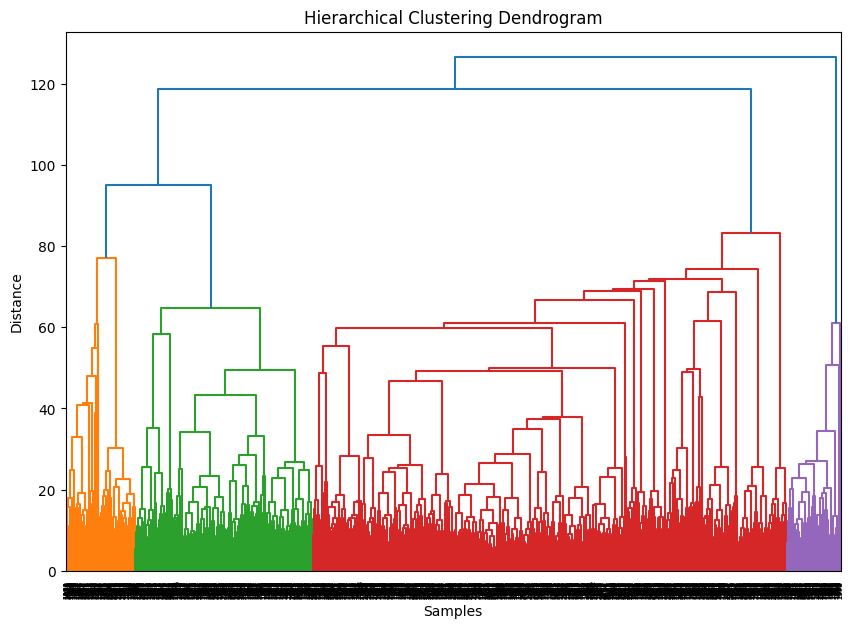

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt

# Perform hierarchical clustering using the linkage method
linked = linkage(df_pca, method='ward')

# Plot the dendrogram
plt.figure(figsize=(10, 7))
dendrogram(linked,
            orientation='top',
            distance_sort='descending',
            show_leaf_counts=False)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Samples')
plt.ylabel('Distance')
plt.show()


In [ ]:
from scipy.cluster.hierarchy import fcluster

# Extract clusters from the hierarchical clustering with the number of clusters set to 3
hierarchical_clusters = fcluster(linked, 4, criterion='maxclust')

# Add the cluster labels to the PCA DataFrame
df_pca['hierarchical_cluster'] = hierarchical_clusters


# Display the first few rows of the PCA DataFrame with new clusters
df_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59,hierarchical_cluster
0,-3.398,0.375,1.728,1.652,2.085,4.446,-0.768,-0.342,-0.004,-0.339,-1.153,1.373,-0.979,-0.194,1.300,-0.286,-1.030,-0.344,0.257,-0.008,0.641,-1.297,1.115,0.382,-0.937,0.149,-0.241,-0.093,0.452,0.460,0.433,-0.434,1.053,0.358,-0.728,-0.827,-0.992,-0.364,-0.408,0.070,-0.740,0.065,0.869,0.316,-0.534,0.502,-0.479,0.640,-0.003,0.403,-0.213,-0.062,0.428,0.026,-0.375,-0.460,0.060,0.013,0.619,2
1,-2.318,-0.617,-0.903,0.510,1.192,-1.690,-1.890,-1.655,-0.070,2.490,0.454,1.232,0.085,-0.054,0.087,1.182,0.188,-0.061,0.265,-0.828,0.421,-0.219,-0.531,-0.024,-0.967,-0.393,-0.597,0.277,-0.441,0.316,-0.158,0.418,-0.560,-0.048,-0.320,0.081,0.492,-0.152,0.079,-0.797,0.207,0.278,0.562,0.664,0.923,-0.901,-0.929,-0.956,0.692,0.002,-0.184,-0.336,-0.204,-0.099,-0.583,1.385,-0.437,-0.375,-0.450,2
2,-2.307,-0.240,1.013,0.649,0.644,-0.998,0.058,-2.982,0.092,-0.783,1.229,-1.179,1.344,1.109,-1.014,-0.895,-0.286,0.571,-0.201,0.356,-0.094,0.572,0.689,-0.435,-0.687,0.041,0.569,0.117,0.065,-0.898,1.877,0.111,0.548,-0.414,-0.261,-1.297,-1.516,0.098,0.438,0.387,0.941,-0.374,0.183,-0.882,-1.601,0.344,0.282,1.060,-0.311,-0.308,0.535,0.057,0.481,0.471,-0.443,-0.030,-0.157,-0.097,0.254,2
3,0.337,-0.689,-0.932,-2.075,-0.477,0.758,-1.869,0.553,1.356,-2.710,-0.138,-0.386,-1.161,-0.348,0.929,-0.015,0.863,0.556,0.210,-0.634,0.728,1.556,-0.833,0.314,0.813,-1.081,-0.750,0.275,-0.883,0.116,-0.616,-0.384,-0.672,-0.283,-0.195,-0.331,-0.156,-0.148,-0.325,1.055,-0.117,-0.989,-0.240,-0.612,-0.233,0.729,-0.099,-0.581,-1.495,-0.700,-0.516,0.713,0.362,0.172,-0.780,0.256,-0.265,0.330,0.192,2
4,3.779,0.239,0.290,0.340,-0.442,0.698,-0.867,0.413,1.343,1.633,0.244,0.978,2.121,-1.459,-0.642,-1.921,0.595,-0.252,-0.514,0.176,-0.446,2.557,-0.231,-0.664,-1.042,0.431,0.369,-0.717,-0.339,-1.057,0.620,0.998,0.013,-0.688,-0.109,1.025,-0.241,-0.635,1.190,0.264,0.948,0.984,-1.131,-0.872,0.097,0.194,-1.706,0.440,0.738,0.660,-1.012,1.738,-0.836,0.568,1.198,0.418,1.828,1.447,-0.158,2


In [ ]:
# Add the original scaled data back to the PCA DataFrame for profiling
cluster_profile_df_hierarchical = data_deep_scaled.copy()
cluster_profile_df_hierarchical['hierarchical_cluster'] = df_pca['hierarchical_cluster']

# Calculate the mean values of each feature for each cluster
cluster_profile_hierarchical = cluster_profile_df_hierarchical.groupby('hierarchical_cluster').mean()


# Display the cluster profile
cluster_profile_hierarchical

,urine_output_per_kg_avg_roll_6hr,urine_output_per_kg_avg_roll_12hr,urine_output_per_kg_avg_roll_24hr,highest_scr,first_scr,is_medical_admission,is_planned_surgery_admission,is_emergency_surgery_admission,is_acute_admission,is_elective_admission,is_deceased_before_admission,is_type_1_diabetes,is_hypertension,is_coronary_artery_disease,is_heart_disease,is_heart_failure,is_cancer,is_type2_diabetes,map,days_admit_to_first_vent,days_vent_param,days_admit_to_first_trach,is_blood_product,is_antibiotic_not,crystalloid,is_synthetic_colloid,is_albumin,norepinephrine,dobutamine,dopamine,iv_vasodilator,hemoglobin_moles_volume_in_blood,hematocrit_pure_volume_fraction_of_blood_by_automated_count,potassium_moles_volume_in_serum_or_plasma,potassium_moles_volume_in_blood,urea_moles_volume_in_blood,ph_of_blood,lactate_moles_volume_in_blood,bicarbonate_moles_volume_in_blood,natriuretic_peptide_b_prohormone_n_terminal_mass_volume_in_serum_or_plasma,sodium_moles_volume_in_blood,sodium_moles_volume_in_serum_or_plasma,glucose_moles_volume_in_blood,creatine_kinase_enzymatic_activity_volume_in_serum_or_plasma,bilirubin_total_moles_volume_in_serum_or_plasma,albumin_mass_volume_in_serum_or_plasma,oxygen_partial_pressure_in_blood,length_of_stay,is_cardiovascular_surgery,is_gastrointestinal_surgery,is_general_surgery,is_sepsis,is_traumatic_injury,is_vascular_surgery,age,height,weight,bmi,is_female,is_male,is_other_sex,days_in_rrt,days_to_start_rrt,is_rrt_in_7_days,mv_days,readmission_7_days_freq,platelets,leukocytes,max_SvO2,max_CRP,amikacin,amphotericin,colistin,gentamicin,sulfamethoxazole,vancomycin,fosinopril,enalaprilaat,captopril,perindopril,irbesartan,valsartan,candesartan,losartan,is_rrt,is_death,kdigo_1,kdigo_2,kdigo_3,is_mv,visit_occurrence_id
hierarchical_cluster,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,0.249,0.238,0.217,-0.193,-0.172,0.104,0.247,0.022,-0.177,-0.122,0.000,0.000,0.000,0.454,0.000,0.000,-0.024,-0.098,-0.008,-0.061,-0.014,0.010,-0.102,0.032,-0.148,-0.202,-0.309,-0.200,0.024,-0.045,0.481,0.374,0.097,-0.026,-0.077,-0.145,0.172,-0.222,0.121,0.091,0.075,-0.002,0.051,-0.076,-0.153,0.258,-0.040,-0.024,0.139,-0.132,-0.138,-0.165,-0.001,-0.119,0.159,-0.054,0.067,0.121,-0.091,0.140,-0.156,-0.140,-0.047,-0.242,-0.018,-0.006,0.057,-0.012,-0.144,-0.216,-0.043,-0.030,-0.029,-0.021,-0.011,-0.033,3.108,-1.290,-1.232,-0.881,-2.980,-2.033,-2.107,2.801,-0.205,-0.278,0.334,-0.092,-0.271,0.098,11074.236
2,0.187,0.183,0.175,-0.221,-0.123,0.005,0.053,-0.007,0.090,0.072,0.000,0.000,0.000,0.004,0.000,0.000,0.085,0.063,0.014,-0.011,-0.193,-0.146,-0.157,-0.033,-0.175,-0.058,-0.133,-0.146,-0.067,0.019,-0.051,-0.044,-0.021,-0.097,-0.109,-0.087,0.068,-0.155,0.062,0.013,-0.067,-0.078,-0.087,-0.125,-0.006,0.071,0.009,-0.189,0.005,0.079,0.059,0.021,0.077,-0.173,-0.001,-0.007,-0.001,0.008,-0.009,-0.018,0.086,-0.229,-0.167,-0.292,-0.182,0.005,0.046,-0.006,0.004,0.012,0.023,-0.204,-0.205,0.045,-0.081,-0.144,-0.200,-0.093,-0.077,0.181,0.142,0.182,0.167,-0.173,-0.315,-0.026,0.248,0.115,-0.340,-0.103,11815.093
3,-0.608,-0.593,-0.562,0.648,0.428,-0.051,-0.163,-0.012,-0.187,-0.122,0.000,0.000,0.000,-0.185,0.000,0.000,-0.166,-0.098,-0.035,-0.046,-0.069,-0.179,0.288,-0.034,0.013,0.168,0.263,0.252,0.080,-0.072,-0.033,0.013,0.035,0.343,0.336,0.260,-0.270,0.526,-0.296,-0.060,0.092,0.157,0.217,0.391,0.103,-0.217,0.044,-0.114,-0.024,-0.132,-0.044,0.022,-0.146,0.537,-0.056,0.027,0.019,-0.009,0.067,-0.020,-0.144,0.441,0.308,0.851,-0.078,-0.002,-0.140,0.062,0.029,-0.014,-0.043,-0.038,-0.038,-0.096,-0.157,-0.061,-0.198,-0.033,-0.031,0.347,0.214,0.353,0.347,-0.100,0.872,0.143,-0.755,-0.255,0.965,0.177,11762.295
4,0.090,0.087,0.080,-0.003,-0.123,0.014,-0.135,0.057,0.002,-0.083,0.000,0.000,0.000,0.096,0.000,0.000,-0.136,-0.098,-0.002,0.237,1.501,1.446,0.409,0.287,1.272,0.124,0.472,0.507,0.232,0.091,0.061,-0.020,-0.023,-0.198,-0.057,0.044,0.097,-0.115,0.243,-0.007,0.160,0.134,0.001,-0.086,-0.108,-0.130,-0.145,1.602,-0.080,-0.096,-0.1

In [ ]:
# Get the distribution of hierarchical clusters
hierarchical_cluster_distribution = df_pca['hierarchical_cluster'].value_counts().sort_index()

# Convert the distribution to a DataFrame for display
hierarchical_cluster_distribution = hierarchical_cluster_distribution.reset_index()
hierarchical_cluster_distribution.columns = ['hierarchical_cluster', 'count']


# Display the cluster distribution
hierarchical_cluster_distribution


,hierarchical_cluster,count
0,1,165
1,2,1465
2,3,550
3,4,215


In [ ]:
from sklearn.metrics import silhouette_score

silhouette_hierarchical = silhouette_score(df_pca.drop(columns=[ 'hierarchical_cluster']), df_pca['hierarchical_cluster'])

silhouette_hierarchical


0.03510356096894631

In [ ]:
# ignore warnings
import warnings
warnings.filterwarnings("ignore")

from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

def try_agglomerative_clustering(n_clusters=8, affinity='euclidean', linkage='ward'):
    # Perform Agglomerative Clustering
    agg_clustering = AgglomerativeClustering(n_clusters=n_clusters, affinity=affinity, linkage=linkage)
    clusters_agg = agg_clustering.fit_predict(df_pca)

    # Add the cluster labels to the original data
    data_deep_scaled['cluster_agg'] = clusters_agg

    # Evaluate the silhouette score
    silhouette_avg = silhouette_score(df_pca, clusters_agg)
    return silhouette_avg, clusters_agg

# Example usage with different hyperparameters and number of clusters
n_clusters_list =  [2, 3, 4, 5, 6]
linkage_methods = ['ward', 'complete', 'average']
affinity_methods = ['euclidean', 'manhattan', 'cosine']

for n_clusters in n_clusters_list:
    for linkage in linkage_methods:
        for affinity in affinity_methods:
            if linkage == 'ward' and affinity != 'euclidean':
                # Ward linkage only supports euclidean affinity
                continue
            silhouette_avg, clusters = try_agglomerative_clustering(n_clusters=n_clusters, affinity=affinity, linkage=linkage)
            print(f"Silhouette Score with n_clusters={n_clusters}, linkage={linkage}, affinity={affinity}: {silhouette_avg}")


Silhouette Score with n_clusters=2, linkage=ward, affinity=euclidean: 0.12999047964325514
Silhouette Score with n_clusters=2, linkage=complete, affinity=euclidean: 0.7742493595973924
Silhouette Score with n_clusters=2, linkage=complete, affinity=manhattan: 0.6123580973359241
Silhouette Score with n_clusters=2, linkage=complete, affinity=cosine: 0.022746672780656514
Silhouette Score with n_clusters=2, linkage=average, affinity=euclidean: 0.7742493595973924
Silhouette Score with n_clusters=2, linkage=average, affinity=manhattan: 0.7742493595973924
Silhouette Score with n_clusters=2, linkage=average, affinity=cosine: 0.6123580973359241
Silhouette Score with n_clusters=3, linkage=ward, affinity=euclidean: 0.12754396522229877
Silhouette Score with n_clusters=3, linkage=complete, affinity=euclidean: 0.693594657854237
Silhouette Score with n_clusters=3, linkage=complete, affinity=manhattan: 0.6126344745873107
Silhouette Score with n_clusters=3, linkage=complete, affinity=cosine: 0.00896781207

In [ ]:
from sklearn.cluster import AgglomerativeClustering

# Implementing the optimal configuration
optimal_agg_clustering = AgglomerativeClustering(n_clusters=4, affinity='manhattan', linkage='complete')
optimal_clusters = optimal_agg_clustering.fit_predict(df_pca)

# Adding the cluster labels to the original data
data_deep_scaled['optimal_cluster'] = optimal_clusters

# Evaluating the silhouette score
optimal_silhouette_score = silhouette_score(df_pca, optimal_clusters)
print(f"Optimal Silhouette Score: {optimal_silhouette_score}")

cluster_summary = data_deep_scaled.groupby('optimal_cluster').mean()
cluster_summary_count = data_deep_scaled['optimal_cluster'].value_counts()

print(cluster_summary_count)

Optimal Silhouette Score: 0.6131581282813383
optimal_cluster
1    2387
0       5
3       2
2       1
Name: count, dtype: int64


In [ ]:
# Define a threshold for small clusters
small_cluster_threshold = 10

# Identify small clusters
small_clusters = cluster_summary_count[cluster_summary_count < small_cluster_threshold].index

# Filter out the outliers
outliers = data_deep_scaled[data_deep_scaled['optimal_cluster'].isin(small_clusters)]
non_outliers = data_deep_scaled[~data_deep_scaled['optimal_cluster'].isin(small_clusters)]

#print("Outliers identified:")
#print(outliers)

# Optional: Remove outliers and re-cluster the data
data_filtered = non_outliers.drop(columns=['optimal_cluster'])
optimal_agg_clustering_filtered = AgglomerativeClustering(n_clusters=4, affinity='manhattan', linkage='complete')
optimal_clusters_filtered = optimal_agg_clustering_filtered.fit_predict(data_filtered)

# Evaluate silhouette score
optimal_silhouette_score_filtered = silhouette_score(data_filtered, optimal_clusters_filtered)
print(f"Optimal Silhouette Score after Removing Outliers: {optimal_silhouette_score_filtered}")

# Summary of filtered clusters
filtered_cluster_summary_count = pd.Series(optimal_clusters_filtered).value_counts()
print("Cluster sizes after removing outliers:")
print(filtered_cluster_summary_count)


Optimal Silhouette Score after Removing Outliers: 0.5494140178880638
Cluster sizes after removing outliers:
0    730
1    598
2    562
3    497
Name: count, dtype: int64


In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import numpy as np

# Assuming 'data_deep' is your original DataFrame with 'visit_occurrence_id'

# Extract the 'visit_occurrence_id' column
visit_occurrence_id = data_deep['visit_occurrence_id']

# Drop the 'visit_occurrence_id' column for scaling
data_to_scale = data_deep.drop(columns=['visit_occurrence_id'])

# Initialize the scaler
scaler = StandardScaler()

# Scale the data
scaled_data = scaler.fit_transform(data_to_scale)

# Create a DataFrame with the scaled data and add the 'visit_occurrence_id' column back
data_deep_scaled = pd.DataFrame(scaled_data, columns=data_to_scale.columns)
data_deep_scaled['visit_occurrence_id'] = visit_occurrence_id

# Prepare data for clustering
data_for_clustering = data_deep_scaled.drop(columns=['visit_occurrence_id'])

# Calculate the correlation matrix
correlation_matrix = data_for_clustering.corr().abs()

# Select upper triangle of correlation matrix
upper = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))

# Find features with correlation greater than 0.9
to_drop = [column for column in upper.columns if any(upper[column] > 0.9)]

# Drop features
data_selected = data_for_clustering.drop(columns=to_drop)
data_selected.shape

# Apply PCA
pca = PCA(n_components=0.95)
pca_result = pca.fit_transform(data_selected)

# Create a DataFrame with the PCA results
pca_columns = [f'PC{i+1}' for i in range(pca_result.shape[1])]
df_pca = pd.DataFrame(pca_result, columns=pca_columns)

# Perform clustering
optimal_agg_clustering = AgglomerativeClustering(n_clusters=4, affinity='manhattan', linkage='complete')
optimal_clusters = optimal_agg_clustering.fit_predict(df_pca)

# Add cluster labels to the original scaled data
data_deep_scaled['optimal_cluster'] = optimal_clusters

# Add cluster labels to the original data
data_deep['optimal_cluster'] = optimal_clusters

# Evaluate silhouette score
optimal_silhouette_score = silhouette_score(df_pca, optimal_clusters)
print(f"Optimal Silhouette Score: {optimal_silhouette_score}")

# Identify small clusters
cluster_summary_count = data_deep['optimal_cluster'].value_counts()
small_cluster_threshold = 10
small_clusters = cluster_summary_count[cluster_summary_count < small_cluster_threshold].index

# Filter out the outliers
outliers = data_deep[data_deep['optimal_cluster'].isin(small_clusters)]
non_outliers = data_deep[~data_deep['optimal_cluster'].isin(small_clusters)]

# Re-cluster the non-outliers data
data_filtered = non_outliers.drop(columns=['optimal_cluster'])
optimal_agg_clustering_filtered = AgglomerativeClustering(n_clusters=4, affinity='manhattan', linkage='complete')
optimal_clusters_filtered = optimal_agg_clustering_filtered.fit_predict(data_filtered.drop(columns=['visit_occurrence_id']))

# Add the new cluster labels to the filtered data
data_filtered['optimal_cluster'] = optimal_clusters_filtered

# Evaluate silhouette score after removing outliers
optimal_silhouette_score_filtered = silhouette_score(data_filtered.drop(columns=['visit_occurrence_id']), optimal_clusters_filtered)
print(f"Optimal Silhouette Score after Removing Outliers: {optimal_silhouette_score_filtered}")

# Summary of filtered clusters
filtered_cluster_summary_count = pd.Series(optimal_clusters_filtered).value_counts()
print("Cluster sizes after removing outliers:")
print(filtered_cluster_summary_count)

# Create cluster profiles with original values
cluster_profile_real = data_filtered.groupby('optimal_cluster').agg(['mean', 'median', 'std', 'count'])
cluster_profile_real_df = pd.DataFrame(cluster_profile_real)

Optimal Silhouette Score: 0.6534437645714195
Optimal Silhouette Score after Removing Outliers: 0.6600524262244776
Cluster sizes after removing outliers:
2    2239
1     109
3      29
0      10
Name: count, dtype: int64


In [ ]:
cluster_profile_real_df

visit_occurrence_id                           \
                               mean    median      std count   
optimal_cluster                                                
0                          9293.100  9758.000 7209.552    10   
1                         11899.046 11982.000 6862.466   109   
2                         11854.856 11989.000 6706.025  2239   
3                         11663.345 12310.000 6853.643    29   

                urine_output_per_kg_avg_roll_6hr                     \
                                            mean median   std count   
optimal_cluster                                                       
0                                          0.659  0.501 0.545    10   
1                                          0.855  0.830 0.685   109   
2                                          0.923  0.929 0.625  2239   
3                                          0.907  0.802 0.748    29   

                urine_output_per_kg_avg_roll_12hr                     \
                                             mean median   std count   
optimal_cluster                                                        
0                                           0.653  0.499 0.514    10   
1                                           0.857  0.822 0.682   109   
2                                           0.919  0.917 0.630  2239   
3                                           0.897  0.817 0.738    29   

                urine_output_per_kg_avg_roll_24hr                     \
                                             mean median   std count   
optimal_cluster                                                        
0                                           0.635  0.521 0.462    10   
1                                           0.853  0.807 0.673   109   
2                                           0.906  0.889 0.643  2239   
3                                           0.878  0.743 0.718    29   

                highest_scr                       first_scr                 \
                       mean  median     std count      mean  median    std   
optimal_cluster                                                              
0                   333.577 354.500  66.926    10   145.900 133.000 83.156   
1                   283.205 278.000 131.055   109   125.587 108.000 64.277   
2                   248.053 217.000 142.204  2239   132.694 113.000 79.378   
3                   260.287 265.000 105.532    29   129.586 111.000 65.048   

                      is_medical_admission                     \
                count                 mean median   std count   
optimal_cluster                                                 
0                  10                0.000  0.000 0.000    10   
1                 109                0.110  0.000 0.314   109   
2                2239                0.226  0.000 0.418  2239   
3                  29                0.103  0.000 0.310    29   

                is_planned_surgery_admission                     \
                                        mean median   std count   
optimal_cluster                                                   
0                                      0.200  0.000 0.422    10   
1                                      0.046  0.000 0.210   109   
2                                      0.067  0.000 0.251  2239   
3                                      0.000  0.000 0.000    29   

                is_emergency_surgery_admission                     \
                                          mean median   std count   
optimal_cluster                                                     
0                                        0.100  0.000 0.316    10   
1                                        0.073  0.000 0.262   109   
2                                        0.092  0.000 0.289  2239   
3                                        0.069  0.000 0.258    29   

                is_acute_admission                    is_elective_admission  \
                       

In [ ]:
cluster_profile_real_df_share = cluster_profile_real_df.drop(columns='visit_occurrence_id')
cluster_profile_real_df_share

urine_output_per_kg_avg_roll_6hr                     \
                                            mean median   std count   
optimal_cluster                                                       
0                                          0.659  0.501 0.545    10   
1                                          0.855  0.830 0.685   109   
2                                          0.923  0.929 0.625  2239   
3                                          0.907  0.802 0.748    29   

                urine_output_per_kg_avg_roll_12hr                     \
                                             mean median   std count   
optimal_cluster                                                        
0                                           0.653  0.499 0.514    10   
1                                           0.857  0.822 0.682   109   
2                                           0.919  0.917 0.630  2239   
3                                           0.897  0.817 0.738    29   

                urine_output_per_kg_avg_roll_24hr                     \
                                             mean median   std count   
optimal_cluster                                                        
0                                           0.635  0.521 0.462    10   
1                                           0.853  0.807 0.673   109   
2                                           0.906  0.889 0.643  2239   
3                                           0.878  0.743 0.718    29   

                highest_scr                       first_scr                 \
                       mean  median     std count      mean  median    std   
optimal_cluster                                                              
0                   333.577 354.500  66.926    10   145.900 133.000 83.156   
1                   283.205 278.000 131.055   109   125.587 108.000 64.277   
2                   248.053 217.000 142.204  2239   132.694 113.000 79.378   
3                   260.287 265.000 105.532    29   129.586 111.000 65.048   

                      is_medical_admission                     \
                count                 mean median   std count   
optimal_cluster                                                 
0                  10                0.000  0.000 0.000    10   
1                 109                0.110  0.000 0.314   109   
2                2239                0.226  0.000 0.418  2239   
3                  29                0.103  0.000 0.310    29   

                is_planned_surgery_admission                     \
                                        mean median   std count   
optimal_cluster                                                   
0                                      0.200  0.000 0.422    10   
1                                      0.046  0.000 0.210   109   
2                                      0.067  0.000 0.251  2239   
3                                      0.000  0.000 0.000    29   

                is_emergency_surgery_admission                     \
                                          mean median   std count   
optimal_cluster                                                     
0                                        0.100  0.000 0.316    10   
1                                        0.073  0.000 0.262   109   
2                                        0.092  0.000 0.289  2239   
3                                        0.069  0.000 0.258    29   

                is_acute_admission                    is_elective_admission  \
                              mean median   std count                  mean   
optimal_cluster                                                               
0                            0.000  0.000 0.000    10                 0.000   
1                            0.101  0.000 0.303   109                 0.028   
2                            0.067  0.000 0.251  2239                 0.014   
3                            0.103  0.000 0.310    29                 0.034  

In [ ]:
cluster_profile_real_df_share.to_csv('cluster_profile_real_df_share.csv', index=False)

In [ ]:
filtered_cluster_summary_count = pd.DataFrame(filtered_cluster_summary_count)
filtered_cluster_summary_count

,count
2,2239
1,109
3,29
0,10


## 4: Polynomial Feature Importance + PCA + Clustering

### Pre-process

In [ ]:
import numpy as np

data_for_clustering = data_deep_scaled.drop(columns=['visit_occurrence_id'])


# Calculate the correlation matrix
correlation_matrix = data_for_clustering.corr().abs()

# Select upper triangle of correlation matrix
upper = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))

# Find features with correlation greater than 0.9
to_drop = [column for column in upper.columns if any(upper[column] > 0.9)]

# Drop features
data_selected = data_for_clustering.drop(columns=to_drop)
data_selected.shape

(2395, 83)

In [ ]:
from sklearn.preprocessing import PolynomialFeatures

# Generate polynomial features
poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
data_poly = poly.fit_transform(data_selected)

# Check the shape of the new data
data_poly.shape


(2395, 3486)

In [ ]:
from sklearn.decomposition import PCA


# Initialize PCA, retaining 95% of the variance
pca = PCA(n_components=0.95)

# Fit and transform the scaled data
pca_result = pca.fit_transform(data_poly)

# Create a DataFrame with the PCA results
pca_columns = [f'PC{i+1}' for i in range(pca_result.shape[1])]
df_pca = pd.DataFrame(pca_result, columns=pca_columns)

In [ ]:
df_pca.shape

(2395, 736)

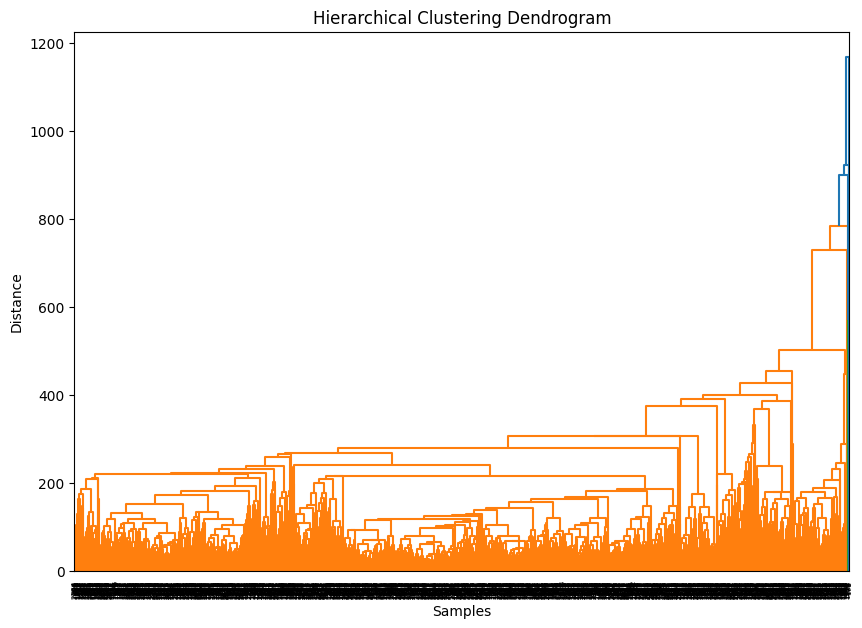

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt

# Perform hierarchical clustering using the linkage method
linked = linkage(df_pca, method='ward')

# Plot the dendrogram
plt.figure(figsize=(10, 7))
dendrogram(linked,
            orientation='top',
            distance_sort='descending',
            show_leaf_counts=False)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Samples')
plt.ylabel('Distance')
plt.show()


In [ ]:
# ignore warnings
import warnings
warnings.filterwarnings("ignore")

from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

def try_agglomerative_clustering(n_clusters=8, affinity='euclidean', linkage='ward'):
    # Perform Agglomerative Clustering
    agg_clustering = AgglomerativeClustering(n_clusters=n_clusters, affinity=affinity, linkage=linkage)
    clusters_agg = agg_clustering.fit_predict(df_pca)

    # Add the cluster labels to the original data
    data_deep_scaled['cluster_agg'] = clusters_agg

    # Evaluate the silhouette score
    silhouette_avg = silhouette_score(df_pca, clusters_agg)
    return silhouette_avg, clusters_agg

# Example usage with different hyperparameters and number of clusters
n_clusters_list =  [2, 3, 4, 5, 6]
linkage_methods = ['ward', 'complete', 'average']
affinity_methods = ['euclidean', 'manhattan', 'cosine']

for n_clusters in n_clusters_list:
    for linkage in linkage_methods:
        for affinity in affinity_methods:
            if linkage == 'ward' and affinity != 'euclidean':
                # Ward linkage only supports euclidean affinity
                continue
            silhouette_avg, clusters = try_agglomerative_clustering(n_clusters=n_clusters, affinity=affinity, linkage=linkage)
            print(f"Silhouette Score with n_clusters={n_clusters}, linkage={linkage}, affinity={affinity}: {silhouette_avg}")


Silhouette Score with n_clusters=2, linkage=ward, affinity=euclidean: 0.9122236973067952
Silhouette Score with n_clusters=2, linkage=complete, affinity=euclidean: 0.9122236973067952
Silhouette Score with n_clusters=2, linkage=complete, affinity=manhattan: 0.8712071217400316
Silhouette Score with n_clusters=2, linkage=complete, affinity=cosine: 0.07573284031600838
Silhouette Score with n_clusters=2, linkage=average, affinity=euclidean: 0.9122236973067952
Silhouette Score with n_clusters=2, linkage=average, affinity=manhattan: 0.8687673460137706
Silhouette Score with n_clusters=2, linkage=average, affinity=cosine: 0.1437676995067177
Silhouette Score with n_clusters=3, linkage=ward, affinity=euclidean: 0.8897381946974627
Silhouette Score with n_clusters=3, linkage=complete, affinity=euclidean: 0.8897381946974627
Silhouette Score with n_clusters=3, linkage=complete, affinity=manhattan: 0.6395710724400803
Silhouette Score with n_clusters=3, linkage=complete, affinity=cosine: 0.0424532817363

In [ ]:
from sklearn.cluster import AgglomerativeClustering

# Implementing the optimal configuration
optimal_agg_clustering = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='complete')
optimal_clusters = optimal_agg_clustering.fit_predict(df_pca)

# Adding the cluster labels to the original data
data_deep_scaled['optimal_cluster'] = optimal_clusters

# Evaluating the silhouette score
optimal_silhouette_score = silhouette_score(df_pca, optimal_clusters)
print(f"Optimal Silhouette Score: {optimal_silhouette_score}")

cluster_summary = data_deep_scaled.groupby('optimal_cluster').mean()
cluster_summary_count = data_deep_scaled['optimal_cluster'].value_counts()

print(cluster_summary_count)

Optimal Silhouette Score: 0.8663871265334763
optimal_cluster
1    2391
0       2
3       1
2       1
Name: count, dtype: int64


In [ ]:
# Define a threshold for small clusters
small_cluster_threshold = 10

# Identify small clusters
small_clusters = cluster_summary_count[cluster_summary_count < small_cluster_threshold].index

# Filter out the outliers
outliers = data_deep_scaled[data_deep_scaled['optimal_cluster'].isin(small_clusters)]
non_outliers = data_deep_scaled[~data_deep_scaled['optimal_cluster'].isin(small_clusters)]

#print("Outliers identified:")
#print(outliers)

# Optional: Remove outliers and re-cluster the data
data_filtered = non_outliers.drop(columns=['optimal_cluster'])
optimal_agg_clustering_filtered = AgglomerativeClustering(n_clusters=4, affinity='manhattan', linkage='complete')
optimal_clusters_filtered = optimal_agg_clustering_filtered.fit_predict(data_filtered)

# Evaluate silhouette score
optimal_silhouette_score_filtered = silhouette_score(data_filtered, optimal_clusters_filtered)
print(f"Optimal Silhouette Score after Removing Outliers: {optimal_silhouette_score_filtered}")

# Summary of filtered clusters
filtered_cluster_summary_count = pd.Series(optimal_clusters_filtered).value_counts()
print("Cluster sizes after removing outliers:")
print(filtered_cluster_summary_count)


Optimal Silhouette Score after Removing Outliers: 0.5583797938369707
Cluster sizes after removing outliers:
0    772
2    607
1    575
3    437
Name: count, dtype: int64


In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import numpy as np

# Assuming 'data_deep' is your original DataFrame with 'visit_occurrence_id'

# Extract the 'visit_occurrence_id' column
visit_occurrence_id = data_deep['visit_occurrence_id']

# Drop the 'visit_occurrence_id' column for scaling
data_to_scale = data_deep.drop(columns=['visit_occurrence_id'])

# Initialize the scaler
scaler = StandardScaler()

# Scale the data
scaled_data = scaler.fit_transform(data_to_scale)

# Create a DataFrame with the scaled data and add the 'visit_occurrence_id' column back
data_deep_scaled = pd.DataFrame(scaled_data, columns=data_to_scale.columns)
data_deep_scaled['visit_occurrence_id'] = visit_occurrence_id

import numpy as np

data_for_clustering = data_deep_scaled.drop(columns=['visit_occurrence_id'])


# Calculate the correlation matrix
correlation_matrix = data_for_clustering.corr().abs()

# Select upper triangle of correlation matrix
upper = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))

# Find features with correlation greater than 0.9
to_drop = [column for column in upper.columns if any(upper[column] > 0.9)]

# Drop features
data_selected = data_for_clustering.drop(columns=to_drop)
data_selected.shape

from sklearn.preprocessing import PolynomialFeatures

# Generate polynomial features
poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
data_poly = poly.fit_transform(data_selected)

# Check the shape of the new data
data_poly.shape

from sklearn.decomposition import PCA


# Initialize PCA, retaining 95% of the variance
pca = PCA(n_components=0.95)

# Fit and transform the scaled data
pca_result = pca.fit_transform(data_poly)

# Create a DataFrame with the PCA results
pca_columns = [f'PC{i+1}' for i in range(pca_result.shape[1])]
df_pca = pd.DataFrame(pca_result, columns=pca_columns)

# Perform clustering
optimal_agg_clustering = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='complete')
optimal_clusters = optimal_agg_clustering.fit_predict(df_pca)

# Add cluster labels to the original scaled data
data_deep_scaled['optimal_cluster'] = optimal_clusters

# Add cluster labels to the original data
data_deep['optimal_cluster'] = optimal_clusters

# Evaluate silhouette score
optimal_silhouette_score = silhouette_score(df_pca, optimal_clusters)
print(f"Optimal Silhouette Score: {optimal_silhouette_score}")

# Identify small clusters
cluster_summary_count = data_deep['optimal_cluster'].value_counts()
small_cluster_threshold = 10
small_clusters = cluster_summary_count[cluster_summary_count < small_cluster_threshold].index

# Filter out the outliers
outliers = data_deep[data_deep['optimal_cluster'].isin(small_clusters)]
non_outliers = data_deep[~data_deep['optimal_cluster'].isin(small_clusters)]

# Re-cluster the non-outliers data
data_filtered = non_outliers.drop(columns=['optimal_cluster'])
optimal_agg_clustering_filtered = AgglomerativeClustering(n_clusters=4, affinity='manhattan', linkage='complete')
optimal_clusters_filtered = optimal_agg_clustering_filtered.fit_predict(data_filtered.drop(columns=['visit_occurrence_id']))

# Add the new cluster labels to the filtered data
data_filtered['optimal_cluster'] = optimal_clusters_filtered

# Evaluate silhouette score after removing outliers
optimal_silhouette_score_filtered = silhouette_score(data_filtered.drop(columns=['visit_occurrence_id']), optimal_clusters_filtered)
print(f"Optimal Silhouette Score after Removing Outliers: {optimal_silhouette_score_filtered}")

# Summary of filtered clusters
filtered_cluster_summary_count = pd.Series(optimal_clusters_filtered).value_counts()
print("Cluster sizes after removing outliers:")
print(filtered_cluster_summary_count)

# Create cluster profiles with original values
cluster_profile_real = data_filtered.groupby('optimal_cluster').agg(['mean', 'median', 'std', 'count'])
cluster_profile_real_df = pd.DataFrame(cluster_profile_real)

Optimal Silhouette Score: 0.91390911202049
Optimal Silhouette Score after Removing Outliers: 0.6603565289957284
Cluster sizes after removing outliers:
2    2242
1     110
3      29
0      10
Name: count, dtype: int64


In [ ]:
df_profile = pd.DataFrame(data_filtered).groupby('optimal_cluster')
df_profile

In [ ]:
cluster_profile_real_df.drop(columns='visit_occurrence_id')

urine_output_per_kg_avg_roll_6hr                     \
                                            mean median   std count   
optimal_cluster                                                       
0                                          0.659  0.501 0.545    10   
1                                          0.856  0.841 0.682   110   
2                                          0.923  0.929 0.625  2242   
3                                          0.907  0.802 0.748    29   

                urine_output_per_kg_avg_roll_12hr                     \
                                             mean median   std count   
optimal_cluster                                                        
0                                           0.653  0.499 0.514    10   
1                                           0.857  0.827 0.678   110   
2                                           0.919  0.917 0.631  2242   
3                                           0.897  0.817 0.738    29   

                urine_output_per_kg_avg_roll_24hr                     \
                                             mean median   std count   
optimal_cluster                                                        
0                                           0.635  0.521 0.462    10   
1                                           0.853  0.808 0.670   110   
2                                           0.906  0.889 0.644  2242   
3                                           0.878  0.743 0.718    29   

                highest_scr                       first_scr                 \
                       mean  median     std count      mean  median    std   
optimal_cluster                                                              
0                   333.577 354.500  66.926    10   145.900 133.000 83.156   
1                   281.721 276.500 131.377   110   125.209 107.500 64.104   
2                   247.975 216.500 142.169  2242   132.698 113.000 79.370   
3                   260.287 265.000 105.532    29   129.586 111.000 65.048   

                      is_medical_admission                     \
                count                 mean median   std count   
optimal_cluster                                                 
0                  10                0.000  0.000 0.000    10   
1                 110                0.109  0.000 0.313   110   
2                2242                0.226  0.000 0.418  2242   
3                  29                0.103  0.000 0.310    29   

                is_planned_surgery_admission                     \
                                        mean median   std count   
optimal_cluster                                                   
0                                      0.200  0.000 0.422    10   
1                                      0.045  0.000 0.209   110   
2                                      0.067  0.000 0.251  2242   
3                                      0.000  0.000 0.000    29   

                is_emergency_surgery_admission                     \
                                          mean median   std count   
optimal_cluster                                                     
0                                        0.100  0.000 0.316    10   
1                                        0.073  0.000 0.261   110   
2                                        0.092  0.000 0.289  2242   
3                                        0.069  0.000 0.258    29   

                is_acute_admission                    is_elective_admission  \
                              mean median   std count                  mean   
optimal_cluster                                                               
0                            0.000  0.000 0.000    10                 0.000   
1                            0.109  0.000 0.313   110                 0.027   
2                            0.067  0.000 0.251  2242                 0.014   
3                            0.103  0.000 0.310    29                 0.034  

In [ ]:
cluster_profile_real_df_share = cluster_profile_real_df.drop(columns='visit_occurrence_id')
cluster_profile_real_df_share

urine_output_per_kg_avg_roll_6hr                     \
                                            mean median   std count   
optimal_cluster                                                       
0                                          0.659  0.501 0.545    10   
1                                          0.855  0.830 0.685   109   
2                                          0.923  0.929 0.625  2239   
3                                          0.907  0.802 0.748    29   

                urine_output_per_kg_avg_roll_12hr                     \
                                             mean median   std count   
optimal_cluster                                                        
0                                           0.653  0.499 0.514    10   
1                                           0.857  0.822 0.682   109   
2                                           0.919  0.917 0.630  2239   
3                                           0.897  0.817 0.738    29   

                urine_output_per_kg_avg_roll_24hr                     \
                                             mean median   std count   
optimal_cluster                                                        
0                                           0.635  0.521 0.462    10   
1                                           0.853  0.807 0.673   109   
2                                           0.906  0.889 0.643  2239   
3                                           0.878  0.743 0.718    29   

                highest_scr                       first_scr                 \
                       mean  median     std count      mean  median    std   
optimal_cluster                                                              
0                   333.577 354.500  66.926    10   145.900 133.000 83.156   
1                   283.205 278.000 131.055   109   125.587 108.000 64.277   
2                   248.053 217.000 142.204  2239   132.694 113.000 79.378   
3                   260.287 265.000 105.532    29   129.586 111.000 65.048   

                      is_medical_admission                     \
                count                 mean median   std count   
optimal_cluster                                                 
0                  10                0.000  0.000 0.000    10   
1                 109                0.110  0.000 0.314   109   
2                2239                0.226  0.000 0.418  2239   
3                  29                0.103  0.000 0.310    29   

                is_planned_surgery_admission                     \
                                        mean median   std count   
optimal_cluster                                                   
0                                      0.200  0.000 0.422    10   
1                                      0.046  0.000 0.210   109   
2                                      0.067  0.000 0.251  2239   
3                                      0.000  0.000 0.000    29   

                is_emergency_surgery_admission                     \
                                          mean median   std count   
optimal_cluster                                                     
0                                        0.100  0.000 0.316    10   
1                                        0.073  0.000 0.262   109   
2                                        0.092  0.000 0.289  2239   
3                                        0.069  0.000 0.258    29   

                is_acute_admission                    is_elective_admission  \
                              mean median   std count                  mean   
optimal_cluster                                                               
0                            0.000  0.000 0.000    10                 0.000   
1                            0.101  0.000 0.303   109                 0.028   
2                            0.067  0.000 0.251  2239                 0.014   
3                            0.103  0.000 0.310    29                 0.034  

In [ ]:
cluster_profile_real_df_share.to_csv('cluster_profile_real_df_share.csv', index=False)

In [ ]:
filtered_cluster_summary_count = pd.DataFrame(filtered_cluster_summary_count)
filtered_cluster_summary_count

,count
2,2239
1,109
3,29
0,10


In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import numpy as np

# Assuming 'data_deep' is your original DataFrame with 'visit_occurrence_id'

# Extract the 'visit_occurrence_id' column
visit_occurrence_id = data_thresh_50_no_miss['visit_occurrence_id']

# Drop the 'visit_occurrence_id' column for scaling
data_to_scale = data_thresh_50_no_miss.drop(columns=['visit_occurrence_id'])

# Initialize the scaler
scaler = StandardScaler()

# Scale the data
scaled_data = scaler.fit_transform(data_to_scale)

# Create a DataFrame with the scaled data and add the 'visit_occurrence_id' column back
data_thresh_50_no_miss_scaled = pd.DataFrame(scaled_data, columns=data_to_scale.columns)
data_thresh_50_no_miss_scaled['visit_occurrence_id'] = visit_occurrence_id

# Prepare data for clustering
data_for_clustering = data_thresh_50_no_miss_scaled.drop(columns=['visit_occurrence_id'])

# Calculate the correlation matrix
correlation_matrix = data_for_clustering.corr().abs()

# Select upper triangle of correlation matrix
upper = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))

# Find features with correlation greater than 0.9
to_drop = [column for column in upper.columns if any(upper[column] > 0.9)]

# Drop highly correlated features
data_selected = data_for_clustering.drop(columns=to_drop)

# Generate polynomial features
poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
data_poly = poly.fit_transform(data_selected)

# Initialize PCA, retaining 95% of the variance
pca = PCA(n_components=0.95)

# Fit and transform the polynomial features
pca_result = pca.fit_transform(data_poly)

# Create a DataFrame with the PCA results
pca_columns = [f'PC{i+1}' for i in range(pca_result.shape[1])]
df_pca = pd.DataFrame(pca_result, columns=pca_columns)

# Perform clustering
optimal_agg_clustering = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='complete')
optimal_clusters = optimal_agg_clustering.fit_predict(df_pca)

# Add cluster labels to the original scaled data
data_thresh_50_no_miss_scaled['optimal_cluster'] = optimal_clusters

# Add cluster labels to the original data
data_thresh_50_no_miss['optimal_cluster'] = optimal_clusters

# Evaluate silhouette score
optimal_silhouette_score = silhouette_score(df_pca, optimal_clusters)
print(f"Optimal Silhouette Score: {optimal_silhouette_score}")

# Identify small clusters
cluster_summary_count = data_thresh_50_no_miss['optimal_cluster'].value_counts()
small_cluster_threshold = 10
small_clusters = cluster_summary_count[cluster_summary_count < small_cluster_threshold].index

# Filter out the outliers
outliers = data_thresh_50_no_miss[data_thresh_50_no_miss['optimal_cluster'].isin(small_clusters)]
non_outliers = data_thresh_50_no_miss[~data_thresh_50_no_miss['optimal_cluster'].isin(small_clusters)]

# Re-cluster the non-outliers data
data_filtered = non_outliers.drop(columns=['optimal_cluster'])
data_filtered_scaled = data_filtered.drop(columns=['visit_occurrence_id'])

# Perform re-clustering on filtered data
optimal_agg_clustering_filtered = AgglomerativeClustering(n_clusters=4, affinity='manhattan', linkage='complete')
optimal_clusters_filtered = optimal_agg_clustering_filtered.fit_predict(data_filtered_scaled)

# Add the new cluster labels to the filtered data
data_filtered['optimal_cluster'] = optimal_clusters_filtered

# Evaluate silhouette score after removing outliers
optimal_silhouette_score_filtered = silhouette_score(data_filtered_scaled, optimal_clusters_filtered)
print(f"Optimal Silhouette Score after Removing Outliers: {optimal_silhouette_score_filtered}")

# Summary of filtered clusters
filtered_cluster_summary_count = pd.Series(optimal_clusters_filtered).value_counts()
print("Cluster sizes after removing outliers:")
print(filtered_cluster_summary_count)

# Create cluster profiles with original values
cluster_profile_real = data_filtered.groupby('optimal_cluster').agg(['mean', 'median', 'std', 'count'])
cluster_profile_real_df = pd.DataFrame(cluster_profile_real)

Optimal Silhouette Score: 0.7927080173499522
Optimal Silhouette Score after Removing Outliers: 0.6711431920289588
Cluster sizes after removing outliers:
2    2243
1     110
3      30
0       8
Name: count, dtype: int64


### K-means (4)

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import numpy as np

# Assuming 'data_deep' is your original DataFrame with 'visit_occurrence_id'

# Extract the 'visit_occurrence_id' column
visit_occurrence_id = data_thresh_50_no_miss['visit_occurrence_id']

# Drop the 'visit_occurrence_id' column for scaling
data_to_scale = data_thresh_50_no_miss.drop(columns=['visit_occurrence_id'])

# Initialize the scaler
scaler = StandardScaler()

# Scale the data
scaled_data = scaler.fit_transform(data_to_scale)

# Create a DataFrame with the scaled data and add the 'visit_occurrence_id' column back
data_thresh_50_no_miss_scaled = pd.DataFrame(scaled_data, columns=data_to_scale.columns)
data_thresh_50_no_miss_scaled['visit_occurrence_id'] = visit_occurrence_id

# Prepare data for clustering
data_for_clustering = data_thresh_50_no_miss_scaled.drop(columns=['visit_occurrence_id'])

# Calculate the correlation matrix
correlation_matrix = data_for_clustering.corr().abs()

# Select upper triangle of correlation matrix
upper = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))

# Find features with correlation greater than 0.9
to_drop = [column for column in upper.columns if any(upper[column] > 0.9)]

# Drop highly correlated features
data_selected = data_for_clustering.drop(columns=to_drop)

# Generate polynomial features
poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
data_poly = poly.fit_transform(data_selected)

# Initialize PCA, retaining 95% of the variance
pca = PCA(n_components=0.95)

# Fit and transform the polynomial features
pca_result = pca.fit_transform(data_poly)

# Create a DataFrame with the PCA results
pca_columns = [f'PC{i+1}' for i in range(pca_result.shape[1])]
df_pca = pd.DataFrame(pca_result, columns=pca_columns)

# Perform clustering with K-means
kmeans = KMeans(n_clusters=4, random_state=42)
kmeans_clusters = kmeans.fit_predict(df_pca)

# Add cluster labels to the original scaled data
data_thresh_50_no_miss_scaled['optimal_cluster'] = kmeans_clusters

# Add cluster labels to the original data
data_thresh_50_no_miss['optimal_cluster'] = kmeans_clusters

# Evaluate silhouette score
optimal_silhouette_score = silhouette_score(df_pca, kmeans_clusters)
print(f"Optimal Silhouette Score: {optimal_silhouette_score}")

# Identify small clusters
cluster_summary_count = data_thresh_50_no_miss['optimal_cluster'].value_counts()
small_cluster_threshold = 10
small_clusters = cluster_summary_count[cluster_summary_count < small_cluster_threshold].index

# Filter out the outliers
outliers = data_thresh_50_no_miss[data_thresh_50_no_miss['optimal_cluster'].isin(small_clusters)]
non_outliers = data_thresh_50_no_miss[~data_thresh_50_no_miss['optimal_cluster'].isin(small_clusters)]

# Re-cluster the non-outliers data
data_filtered = non_outliers.drop(columns=['optimal_cluster'])
data_filtered_scaled = data_filtered.drop(columns=['visit_occurrence_id'])

# Perform re-clustering on filtered data with K-means
kmeans_filtered = KMeans(n_clusters=4, random_state=42)
kmeans_clusters_filtered = kmeans_filtered.fit_predict(data_filtered_scaled)

# Add the new cluster labels to the filtered data
data_filtered['optimal_cluster'] = kmeans_clusters_filtered

# Evaluate silhouette score after removing outliers
optimal_silhouette_score_filtered = silhouette_score(data_filtered_scaled, kmeans_clusters_filtered)
print(f"Optimal Silhouette Score after Removing Outliers: {optimal_silhouette_score_filtered}")

# Summary of filtered clusters
filtered_cluster_summary_count = pd.Series(kmeans_clusters_filtered).value_counts()
print("Cluster sizes after removing outliers:")
print(filtered_cluster_summary_count)

# Create cluster profiles with original values
cluster_profile_real = data_filtered.groupby('optimal_cluster').agg(['mean', 'median', 'std', 'count'])
cluster_profile_real_df = pd.DataFrame(cluster_profile_real)

Optimal Silhouette Score: 0.8017216891952003
Optimal Silhouette Score after Removing Outliers: 0.582080501108692
Cluster sizes after removing outliers:
3    1361
0     737
1     253
2      41
Name: count, dtype: int64


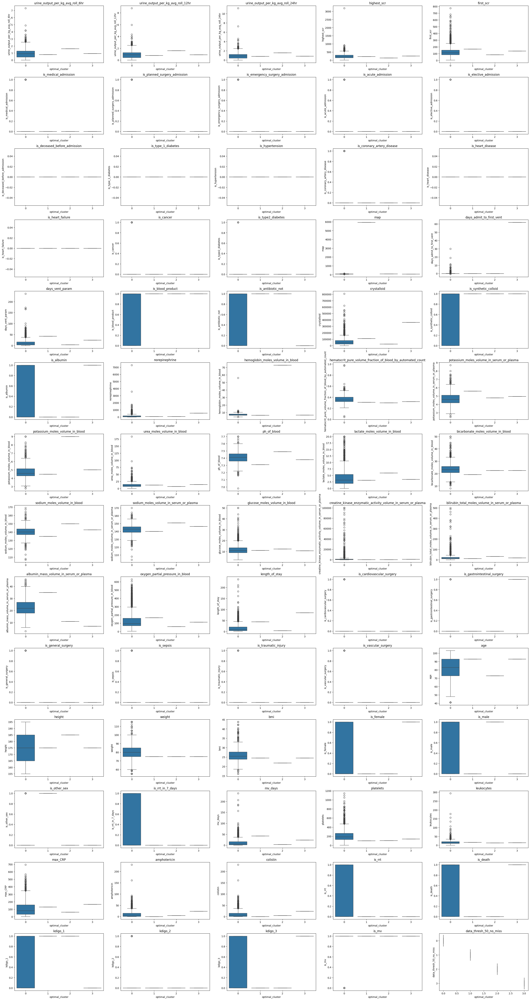

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define your color palette for the clusters
palette = {"0": "C0", "1": "C1", "2": "C2", "3": "C3"}

# Convert cluster labels to strings for consistency with the palette keys
data_thresh_50_no_miss['data_thresh_50_no_miss'] = data_thresh_50_no_miss['optimal_cluster'].astype(str)

# Get the list of columns to plot, excluding 'visit_occurrence_id' and 'optimal_cluster'
cols = [col for col in data_thresh_50_no_miss.columns if col not in ['visit_occurrence_id', 'optimal_cluster']]

# Set up the matplotlib figure with increased height
plt.figure(figsize=(30, 60))  # Adjust the size as needed

# Create subplots for each variable
for i, variable in enumerate(cols):
    plt.subplot((len(cols) // 5) + 1, 5, i + 1)
    sns.boxplot(y=data_thresh_50_no_miss[variable], x=data_thresh_50_no_miss['optimal_cluster'], palette=palette, order=["0", "1", "2", "3"])
    plt.title(variable)
    plt.tight_layout()
    plt.legend([], [], frameon=False)  # Remove the legend

plt.show()

### K-means (3)

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import numpy as np

# Assuming 'data_deep' is your original DataFrame with 'visit_occurrence_id'

# Extract the 'visit_occurrence_id' column
visit_occurrence_id = data_thresh_50_no_miss['visit_occurrence_id']

# Drop the 'visit_occurrence_id' column for scaling
data_to_scale = data_thresh_50_no_miss.drop(columns=['visit_occurrence_id'])

# Initialize the scaler
scaler = StandardScaler()

# Scale the data
scaled_data = scaler.fit_transform(data_to_scale)

# Create a DataFrame with the scaled data and add the 'visit_occurrence_id' column back
data_thresh_50_no_miss_scaled = pd.DataFrame(scaled_data, columns=data_to_scale.columns)
data_thresh_50_no_miss_scaled['visit_occurrence_id'] = visit_occurrence_id

# Prepare data for clustering
data_for_clustering = data_thresh_50_no_miss_scaled.drop(columns=['visit_occurrence_id'])

# Calculate the correlation matrix
correlation_matrix = data_for_clustering.corr().abs()

# Select upper triangle of correlation matrix
upper = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))

# Find features with correlation greater than 0.9
to_drop = [column for column in upper.columns if any(upper[column] > 0.9)]

# Drop highly correlated features
data_selected = data_for_clustering.drop(columns=to_drop)

# Generate polynomial features
poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
data_poly = poly.fit_transform(data_selected)

# Initialize PCA, retaining 95% of the variance
pca = PCA(n_components=0.95)

# Fit and transform the polynomial features
pca_result = pca.fit_transform(data_poly)

# Create a DataFrame with the PCA results
pca_columns = [f'PC{i+1}' for i in range(pca_result.shape[1])]
df_pca = pd.DataFrame(pca_result, columns=pca_columns)

# Perform clustering with K-means
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans_clusters = kmeans.fit_predict(df_pca)

# Add cluster labels to the original scaled data
data_thresh_50_no_miss_scaled['optimal_cluster'] = kmeans_clusters

# Add cluster labels to the original data
data_thresh_50_no_miss['optimal_cluster'] = kmeans_clusters

# Evaluate silhouette score
optimal_silhouette_score = silhouette_score(df_pca, kmeans_clusters)
print(f"Optimal Silhouette Score: {optimal_silhouette_score}")

# Identify small clusters
cluster_summary_count = data_thresh_50_no_miss['optimal_cluster'].value_counts()
small_cluster_threshold = 10
small_clusters = cluster_summary_count[cluster_summary_count < small_cluster_threshold].index

# Filter out the outliers
outliers = data_thresh_50_no_miss[data_thresh_50_no_miss['optimal_cluster'].isin(small_clusters)]
non_outliers = data_thresh_50_no_miss[~data_thresh_50_no_miss['optimal_cluster'].isin(small_clusters)]

# Re-cluster the non-outliers data
data_filtered = non_outliers.drop(columns=['optimal_cluster'])
data_filtered_scaled = data_filtered.drop(columns=['visit_occurrence_id'])

# Perform re-clustering on filtered data with K-means
kmeans_filtered = KMeans(n_clusters=3, random_state=42)
kmeans_clusters_filtered = kmeans_filtered.fit_predict(data_filtered_scaled)

# Add the new cluster labels to the filtered data
data_filtered['optimal_cluster'] = kmeans_clusters_filtered

# Evaluate silhouette score after removing outliers
optimal_silhouette_score_filtered = silhouette_score(data_filtered_scaled, kmeans_clusters_filtered)
print(f"Optimal Silhouette Score after Removing Outliers: {optimal_silhouette_score_filtered}")

# Summary of filtered clusters
filtered_cluster_summary_count = pd.Series(kmeans_clusters_filtered).value_counts()
print("Cluster sizes after removing outliers:")
print(filtered_cluster_summary_count)

# Create cluster profiles with original values
cluster_profile_real = data_filtered.groupby('optimal_cluster').agg(['mean', 'median', 'std', 'count'])
cluster_profile_real_df = pd.DataFrame(cluster_profile_real)

Optimal Silhouette Score: 0.9338520605839692
Optimal Silhouette Score after Removing Outliers: 0.648551661442332
Cluster sizes after removing outliers:
1    1839
0     511
2      43
Name: count, dtype: int64


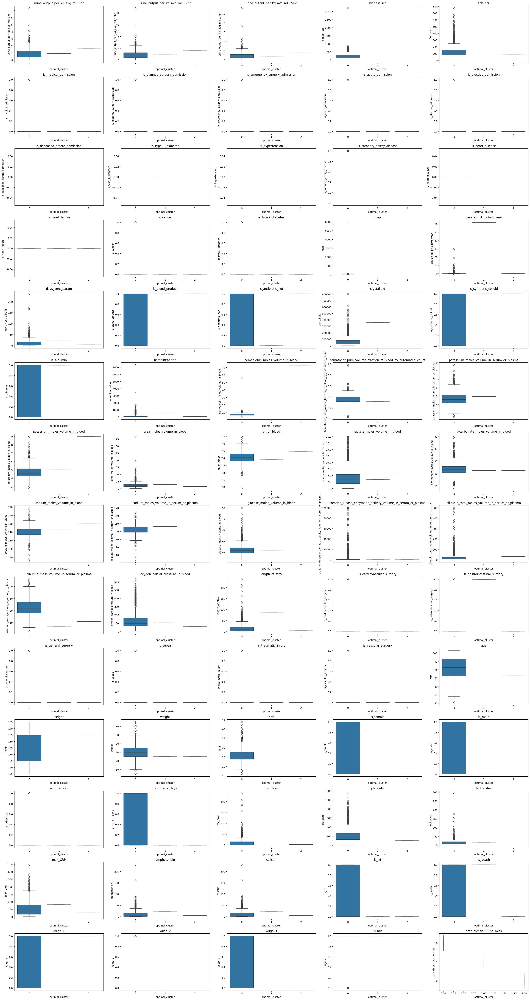

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define your color palette for the clusters
palette = {"0": "C0", "1": "C1", "2": "C2"}

# Convert cluster labels to strings for consistency with the palette keys
data_thresh_50_no_miss['data_thresh_50_no_miss'] = data_thresh_50_no_miss['optimal_cluster'].astype(str)

# Get the list of columns to plot, excluding 'visit_occurrence_id' and 'optimal_cluster'
cols = [col for col in data_thresh_50_no_miss.columns if col not in ['visit_occurrence_id', 'optimal_cluster']]

# Set up the matplotlib figure with increased height
plt.figure(figsize=(30, 60))  # Adjust the size as needed

# Create subplots for each variable
for i, variable in enumerate(cols):
    plt.subplot((len(cols) // 5) + 1, 5, i + 1)
    sns.boxplot(y=data_thresh_50_no_miss[variable], x=data_thresh_50_no_miss['optimal_cluster'], palette=palette, order=["0", "1", "2"])
    plt.title(variable)
    plt.tight_layout()
    plt.legend([], [], frameon=False)  # Remove the legend

plt.show()

# Deep-Learning Clustering

## Autoencoder

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Preprocess data
X = data_deep.drop(columns=['visit_occurrence_id']).values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.models import Model

input_dim = X_scaled.shape[1]
encoding_dim = 10  # You can adjust this

# Encoder
input_layer = Input(shape=(input_dim,))
encoder = Dense(encoding_dim, activation="relu")(input_layer)

# Decoder
decoder = Dense(input_dim, activation="sigmoid")(encoder)

# Autoencoder
autoencoder = Model(inputs=input_layer, outputs=decoder)

# Compile autoencoder
autoencoder.compile(optimizer='adam', loss='mse')

# Summary of the autoencoder
autoencoder.summary()


Model: "model_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 91)]              0         
                                                                 
 dense_20 (Dense)            (None, 10)                920       
                                                                 
 dense_21 (Dense)            (None, 91)                1001      
                                                                 
Total params: 1921 (7.50 KB)
Trainable params: 1921 (7.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
# Train the autoencoder
autoencoder.fit(X_scaled, X_scaled, epochs=100, batch_size=256, shuffle=True, validation_split=0.2)


Epoch 1/100
8/8 [==============================] - 1s 43ms/step - loss: 1.2100 - val_loss: 1.1551
Epoch 2/100
8/8 [==============================] - 0s 13ms/step - loss: 1.1958 - val_loss: 1.1420
Epoch 3/100
8/8 [==============================] - 0s 7ms/step - loss: 1.1824 - val_loss: 1.1292
Epoch 4/100
8/8 [==============================] - 0s 6ms/step - loss: 1.1690 - val_loss: 1.1163
Epoch 5/100
8/8 [==============================] - 0s 7ms/step - loss: 1.1553 - val_loss: 1.1029
Epoch 6/100
8/8 [==============================] - 0s 9ms/step - loss: 1.1410 - val_loss: 1.0888
Epoch 7/100
8/8 [==============================] - 0s 10ms/step - loss: 1.1259 - val_loss: 1.0738
Epoch 8/100
8/8 [==============================] - 0s 7ms/step - loss: 1.1101 - val_loss: 1.0581
Epoch 9/100
8/8 [==============================] - 0s 7ms/step - loss: 1.0937 - val_loss: 1.0419
Epoch 10/100
8/8 [==============================] - 0s 7ms/step - loss: 1.0768 - val_loss: 1.0255
Epoch 11/100
8/8 [========

In [ ]:
# Extract encoder
encoder_model = Model(inputs=autoencoder.input, outputs=autoencoder.get_layer(index=1).output)

# Get encoded data
encoded_data = encoder_model.predict(X_scaled)


75/75 [==============================] - 0s 2ms/step


In [ ]:
from sklearn.cluster import KMeans

# Perform K-Means clustering on the encoded data
n_clusters = 4  # Number of clusters you want
kmeans = KMeans(n_clusters=n_clusters)
y_pred = kmeans.fit_predict(encoded_data)

# Add cluster labels to original data
data_deep['cluster'] = y_pred


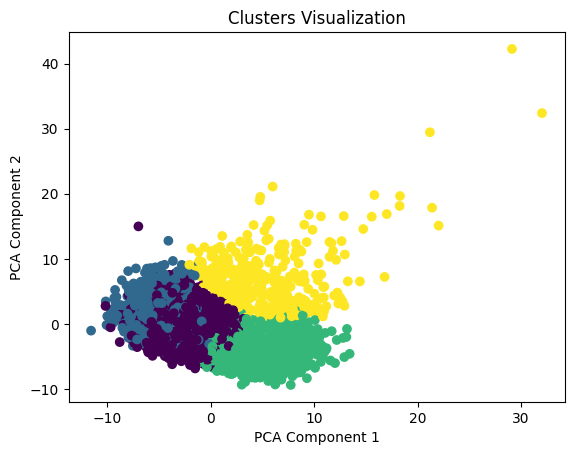

In [ ]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Reduce dimensions for visualization
pca = PCA(n_components=2)
pca_data = pca.fit_transform(encoded_data)

plt.scatter(pca_data[:, 0], pca_data[:, 1], c=y_pred)
plt.title("Clusters Visualization")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.show()


In [ ]:
# Calculate cluster profile
cluster_profile = data_deep.drop(columns='visit_occurrence_id').groupby('cluster').agg(['mean', 'median', 'std'])
cluster_profile = pd.DataFrame(cluster_profile)
cluster_profile

urine_output_per_kg_avg_roll_6hr               \
                                    mean median   std   
cluster                                                 
0                                  1.163  1.097 0.603   
1                                  1.122  1.085 0.502   
2                                  0.360  0.226 0.365   
3                                  0.973  0.953 0.590   

        urine_output_per_kg_avg_roll_12hr               \
                                     mean median   std   
cluster                                                  
0                                   1.158  1.090 0.616   
1                                   1.107  1.077 0.499   
2                                   0.363  0.237 0.360   
3                                   0.974  0.944 0.610   

        urine_output_per_kg_avg_roll_24hr              highest_scr          \
                                     mean median   std        mean  median   
cluster                                                                      
0                                   1.142  1.068 0.649     200.654 180.000   
1                                   1.076  1.027 0.497     211.245 179.000   
2                                   0.366  0.241 0.351     355.008 331.000   
3                                   0.968  0.911 0.640     251.032 239.500   

                first_scr                 is_medical_admission               \
            std      mean  median     std                 mean median   std   
cluster                                                                       
0        94.672   113.949 102.000  59.161                0.243  0.000 0.429   
1       111.431   112.848 102.500  51.215                0.211  0.000 0.408   
2       175.371   182.247 147.000 103.508                0.255  0.000 0.436   
3       114.167   119.813 102.500  63.323                0.088  0.000 0.284   

        is_planned_surgery_admission               \
                                mean median   std   
cluster                                             
0                              0.029  0.000 0.168   
1                              0.256  0.000 0.437   
2                              0.016  0.000 0.126   
3                              0.031  0.000 0.174   

        is_emergency_surgery_admission              is_acute_admission         \
                                  mean median   std               mean median   
cluster                                                                         
0                                0.066  0.000 0.249              0.059  0.000   
1                                0.211  0.000 0.408              0.014  0.000   
2                                0.066  0.000 0.248              0.111  0.000   
3                                0.060  0.000 0.237              0.091  0.000   

              is_elective_admission              is_deceased_before_admission  \
          std                  mean median   std                         mean   
cluster                                                                         
0       0.236                 0.014  0.000 0.118                        0.000   
1       0.119                 0.009  0.000 0.097                        0.000   
2       0.314                 0.018  0.000 0.132                        0.000   
3       0.288                 0.017  0.000 0.130                        0.000   

                     is_type_1_diabetes              is_hypertension         \
        median   std               mean median   std            mean median   
cluster                                                                       
0        0.000 0.000              0.000  0.000 0.000           0.000  0.000   
1        0.000 0.000              0.000  0.000 0.000           0.000  0.000   
2        0.000 0.000              0.000  0.000 0.000           0.000  0.000   
3        0.000 0.000              0.000  0.000 0.000           0.000  0.000   

              is_coronary_artery_disea

In [ ]:
cluster_profile.to_csv('cluster_profile_agg_autoencoder.csv', index=False)

In [ ]:
data_deep.to_csv('cluster_profile_original_autoencoder.csv', index=False)

In [ ]:
cluster_summary_count = data_deep['cluster'].value_counts()
print("Cluster sizes:")
print(cluster_summary_count)

Cluster sizes:
cluster
0    997
2    624
1    422
3    352
Name: count, dtype: int64


In [ ]:
from sklearn.metrics import silhouette_score

# Calculate silhouette score
score = silhouette_score(encoded_data, y_pred)
print(f"Silhouette Score: {score}")


Silhouette Score: 0.2062768042087555


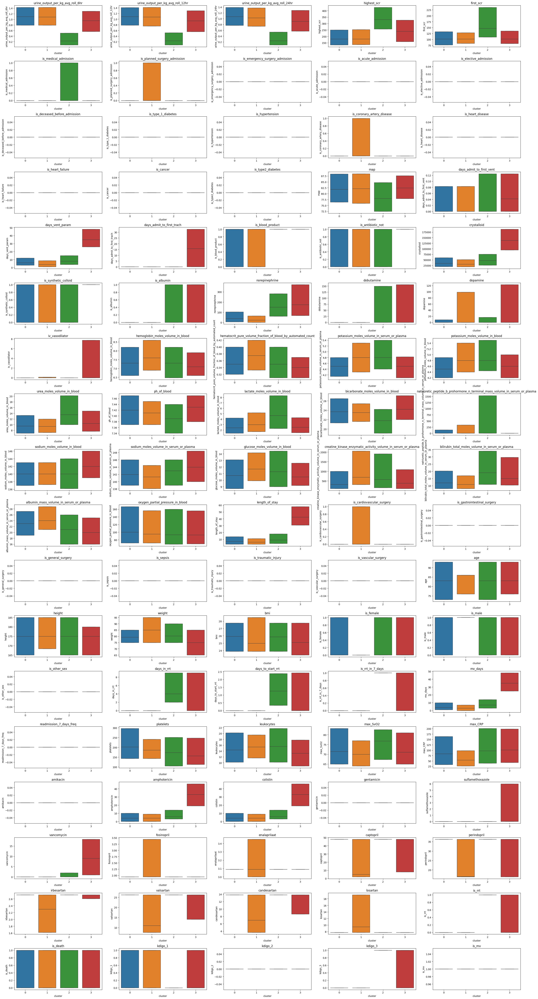

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define your color palette for the clusters
palette = {"0": "C0", "1": "C1", "2": "C2", "3": "C3"}

# Convert cluster labels to strings for consistency with the palette keys
data_deep['cluster'] = data_deep['cluster'].astype(str)

# Get the list of columns to plot, excluding 'visit_occurrence_id' and 'optimal_cluster'
cols = [col for col in data_deep.columns if col not in ['visit_occurrence_id', 'cluster']]

# Set up the matplotlib figure with increased height
plt.figure(figsize=(30, 60))  # Adjust the size as needed

# Create subplots for each variable
for i, variable in enumerate(cols):
    plt.subplot((len(cols) // 5) + 1, 5, i + 1)
    sns.boxplot(y=data_deep[variable], x=data_deep['cluster'], palette=palette, order=["0", "1", "2", "3"],
                showfliers=False, whis=0)
    plt.title(variable)
    plt.tight_layout()
    plt.legend([], [], frameon=False)  # Remove the legend

plt.savefig('box_plot_autoencoder.png')
plt.show()

## Autoencoder 2

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Preprocess data
X = data_deep.drop(columns=['visit_occurrence_id']).values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.models import Model

import tensorflow as tf
import numpy as np
import random

# Set random seeds for reproducibility
random_seed = 42
tf.random.set_seed(random_seed)
np.random.seed(random_seed)
random.seed(random_seed)

input_dim = X_scaled.shape[1]
encoding_dim = 10  # You can adjust this

# Encoder
input_layer = Input(shape=(input_dim,))
encoder = Dense(encoding_dim, activation="relu")(input_layer)

# Decoder
decoder = Dense(input_dim, activation="sigmoid")(encoder)

# Autoencoder
autoencoder = Model(inputs=input_layer, outputs=decoder)

# Compile autoencoder
autoencoder.compile(optimizer='adam', loss='mse')

# Summary of the autoencoder
autoencoder.summary()


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 90)]              0         
                                                                 
 dense (Dense)               (None, 10)                910       
                                                                 
 dense_1 (Dense)             (None, 90)                990       
                                                                 
Total params: 1900 (7.42 KB)
Trainable params: 1900 (7.42 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
# Train the autoencoder
autoencoder.fit(X_scaled, X_scaled, epochs=100, batch_size=256, shuffle=True, validation_split=0.2)


Epoch 1/100
8/8 [==============================] - 1s 25ms/step - loss: 1.2020 - val_loss: 1.1498
Epoch 2/100
8/8 [==============================] - 0s 7ms/step - loss: 1.1886 - val_loss: 1.1366
Epoch 3/100
8/8 [==============================] - 0s 7ms/step - loss: 1.1752 - val_loss: 1.1231
Epoch 4/100
8/8 [==============================] - 0s 6ms/step - loss: 1.1614 - val_loss: 1.1092
Epoch 5/100
8/8 [==============================] - 0s 6ms/step - loss: 1.1470 - val_loss: 1.0944
Epoch 6/100
8/8 [==============================] - 0s 6ms/step - loss: 1.1316 - val_loss: 1.0788
Epoch 7/100
8/8 [==============================] - 0s 6ms/step - loss: 1.1156 - val_loss: 1.0624
Epoch 8/100
8/8 [==============================] - 0s 6ms/step - loss: 1.0986 - val_loss: 1.0455
Epoch 9/100
8/8 [==============================] - 0s 7ms/step - loss: 1.0811 - val_loss: 1.0284
Epoch 10/100
8/8 [==============================] - 0s 6ms/step - loss: 1.0638 - val_loss: 1.0112
Epoch 11/100
8/8 [==========

In [ ]:
# Extract encoder
encoder_model = Model(inputs=autoencoder.input, outputs=autoencoder.get_layer(index=1).output)

# Get encoded data
encoded_data = encoder_model.predict(X_scaled)


75/75 [==============================] - 0s 1ms/step


In [ ]:
from sklearn.cluster import KMeans

# Perform K-Means clustering on the encoded data
n_clusters = 4  # Number of clusters you want
kmeans = KMeans(n_clusters=n_clusters)
y_pred = kmeans.fit_predict(encoded_data)

# Add cluster labels to original data
data_deep['cluster'] = y_pred


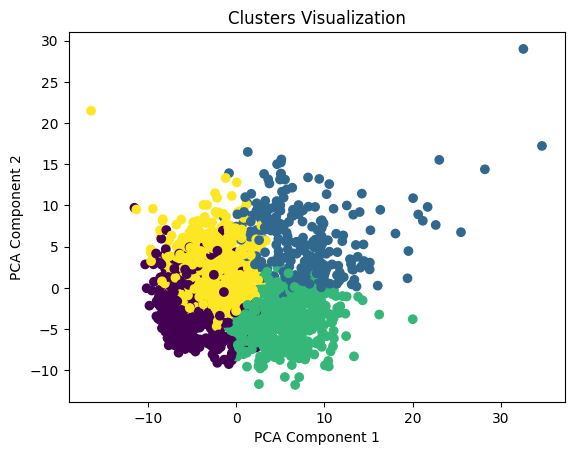

In [ ]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Reduce dimensions for visualization
pca = PCA(n_components=2)
pca_data = pca.fit_transform(encoded_data)

plt.scatter(pca_data[:, 0], pca_data[:, 1], c=y_pred)
plt.title("Clusters Visualization")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.show()


In [ ]:
# Calculate cluster profile
cluster_profile = data_deep.drop(columns='visit_occurrence_id').groupby('cluster').agg(['mean', 'median', 'std'])
cluster_profile = pd.DataFrame(cluster_profile)
cluster_profile

urine_output_per_kg_avg_roll_6hr               \
                                    mean median   std   
cluster                                                 
0                                  1.039  1.016 0.509   
1                                  0.759  0.794 0.508   
2                                  0.391  0.248 0.396   
3                                  1.203  1.140 0.618   

        urine_output_per_kg_avg_roll_12hr               \
                                     mean median   std   
cluster                                                  
0                                   1.024  0.996 0.500   
1                                   0.759  0.788 0.506   
2                                   0.392  0.253 0.390   
3                                   1.200  1.126 0.638   

        urine_output_per_kg_avg_roll_24hr              highest_scr          \
                                     mean median   std        mean  median   
cluster                                                                      
0                                   0.995  0.956 0.488     221.794 185.000   
1                                   0.755  0.773 0.501     288.137 278.500   
2                                   0.393  0.262 0.379     348.311 325.000   
3                                   1.187  1.108 0.680     197.778 177.000   

                first_scr                 is_medical_admission               \
            std      mean  median     std                 mean median   std   
cluster                                                                       
0       115.581   117.675 106.000  60.134                0.190  0.000 0.393   
1       119.865   134.545 111.000  78.065                0.103  0.000 0.305   
2       179.437   185.554 161.000 102.175                0.269  0.000 0.444   
3        94.518   108.944 100.000  52.777                0.234  0.000 0.423   

        is_planned_surgery_admission               \
                                mean median   std   
cluster                                             
0                              0.264  0.000 0.441   
1                              0.021  0.000 0.143   
2                              0.009  0.000 0.092   
3                              0.017  0.000 0.131   

        is_emergency_surgery_admission              is_acute_admission         \
                                  mean median   std               mean median   
cluster                                                                         
0                                0.188  0.000 0.391              0.012  0.000   
1                                0.052  0.000 0.222              0.034  0.000   
2                                0.065  0.000 0.247              0.139  0.000   
3                                0.070  0.000 0.255              0.067  0.000   

              is_elective_admission              is_deceased_before_admission  \
          std                  mean median   std                         mean   
cluster                                                                         
0       0.110                 0.014  0.000 0.119                        0.000   
1       0.183                 0.017  0.000 0.130                        0.000   
2       0.347                 0.015  0.000 0.124                        0.000   
3       0.250                 0.014  0.000 0.116                        0.000   

                     is_type_1_diabetes              is_hypertension         \
        median   std               mean median   std            mean median   
cluster                                                                       
0        0.000 0.000              0.000  0.000 0.000           0.000  0.000   
1        0.000 0.000              0.000  0.000 0.000           0.000  0.000   
2        0.000 0.000              0.000  0.000 0.000           0.000  0.000   
3        0.000 0.000              0.000  0.000 0.000           0.000  0.000   

              is_coronary_artery_disea

In [ ]:
cluster_profile.to_csv('cluster_profile_agg_autoencoder.csv', index=False)

In [ ]:
data_deep.to_csv('cluster_profile_original_autoencoder.csv', index=False)

In [ ]:
cluster_summary_count = data_deep['cluster'].value_counts()
print("Cluster sizes:")
print(cluster_summary_count)

Cluster sizes:
cluster
3    1035
2     581
0     489
1     290
Name: count, dtype: int64


In [ ]:
from sklearn.metrics import silhouette_score

# Calculate silhouette score
score = silhouette_score(encoded_data, y_pred)
print(f"Silhouette Score: {score}")


Silhouette Score: 0.1841624528169632


### Plot

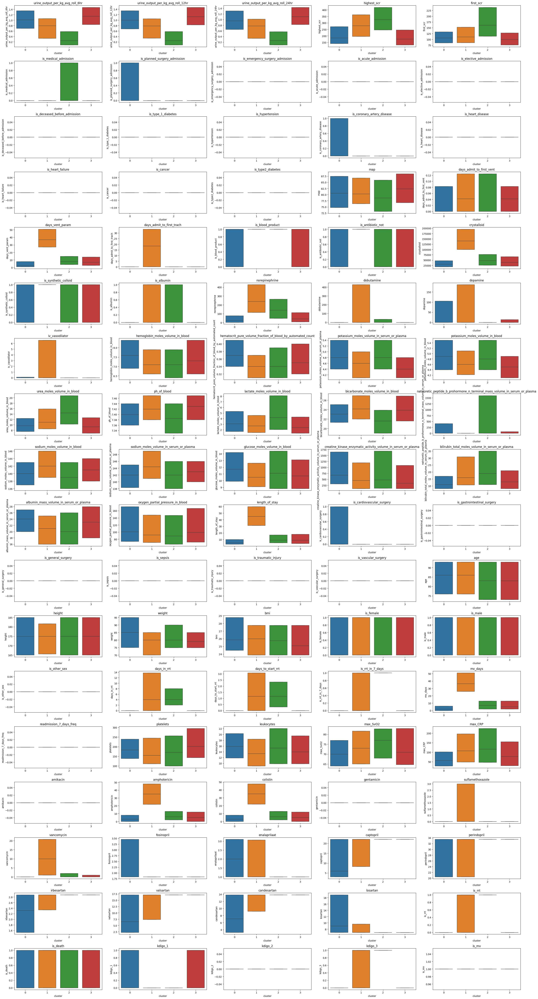

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define your color palette for the clusters
palette = {"0": "C0", "1": "C1", "2": "C2", "3": "C3"}

# Convert cluster labels to strings for consistency with the palette keys
data_deep['cluster'] = data_deep['cluster'].astype(str)

# Get the list of columns to plot, excluding 'visit_occurrence_id' and 'optimal_cluster'
cols = [col for col in data_deep.columns if col not in ['visit_occurrence_id', 'cluster']]

# Set up the matplotlib figure with increased height
plt.figure(figsize=(30, 60))  # Adjust the size as needed

# Create subplots for each variable
for i, variable in enumerate(cols):
    plt.subplot((len(cols) // 5) + 1, 5, i + 1)
    sns.boxplot(y=data_deep[variable], x=data_deep['cluster'], palette=palette, order=["0", "1", "2", "3"],
                showfliers=False, whis=0)
    plt.title(variable)
    plt.tight_layout()
    plt.legend([], [], frameon=False)  # Remove the legend

plt.savefig('box_plot_autoencoder.png')
plt.show()

## Autoencoder 3

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Preprocess data
X = data_deep.drop(columns=['visit_occurrence_id']).values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization, LeakyReLU
from tensorflow.keras.models import Model

import tensorflow as tf
import numpy as np
import random

# Set random seeds for reproducibility
random_seed = 42
tf.random.set_seed(random_seed)
np.random.seed(random_seed)
random.seed(random_seed)


input_dim = X_scaled.shape[1]
encoding_dim = 10  # Latent space dimension

# Encoder
input_layer = Input(shape=(input_dim,))
encoder = Dense(256)(input_layer)
encoder = LeakyReLU(alpha=0.2)(encoder)
encoder = BatchNormalization()(encoder)
encoder = Dropout(0.5)(encoder)

encoder = Dense(128)(encoder)
encoder = LeakyReLU(alpha=0.2)(encoder)
encoder = BatchNormalization()(encoder)
encoder = Dropout(0.5)(encoder)

encoder = Dense(64)(encoder)
encoder = LeakyReLU(alpha=0.2)(encoder)
encoder = BatchNormalization()(encoder)
encoder = Dropout(0.5)(encoder)

encoder_output = Dense(encoding_dim, activation="relu")(encoder)

# Decoder
decoder = Dense(64)(encoder_output)
decoder = LeakyReLU(alpha=0.2)(decoder)
decoder = BatchNormalization()(decoder)
decoder = Dropout(0.5)(decoder)

decoder = Dense(128)(decoder)
decoder = LeakyReLU(alpha=0.2)(decoder)
decoder = BatchNormalization()(decoder)
decoder = Dropout(0.5)(decoder)

decoder = Dense(256)(decoder)
decoder = LeakyReLU(alpha=0.2)(decoder)
decoder = BatchNormalization()(decoder)
decoder = Dropout(0.5)(decoder)

decoder_output = Dense(input_dim, activation="sigmoid")(decoder)

# Autoencoder
autoencoder = Model(inputs=input_layer, outputs=decoder_output)

# Compile autoencoder
autoencoder.compile(optimizer='adam', loss='mse')

# Summary of the autoencoder
autoencoder.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 90)]              0         
                                                                 
 dense (Dense)               (None, 256)               23296     
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 256)               0         
                                                                 
 batch_normalization (Batch  (None, 256)               1024      
 Normalization)                                                  
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 128)               32896     
                                                             

In [ ]:
# Train the autoencoder
autoencoder.fit(X_scaled, X_scaled, epochs=100, batch_size=256, shuffle=True, validation_split=0.2)


Epoch 1/300
8/8 [==============================] - 4s 69ms/step - loss: 1.2690 - val_loss: 1.1511
Epoch 2/300
8/8 [==============================] - 0s 17ms/step - loss: 1.2460 - val_loss: 1.1357
Epoch 3/300
8/8 [==============================] - 0s 17ms/step - loss: 1.2206 - val_loss: 1.1127
Epoch 4/300
8/8 [==============================] - 0s 17ms/step - loss: 1.1869 - val_loss: 1.0880
Epoch 5/300
8/8 [==============================] - 0s 17ms/step - loss: 1.1511 - val_loss: 1.0710
Epoch 6/300
8/8 [==============================] - 0s 17ms/step - loss: 1.1173 - val_loss: 1.0617
Epoch 7/300
8/8 [==============================] - 0s 17ms/step - loss: 1.0820 - val_loss: 1.0529
Epoch 8/300
8/8 [==============================] - 0s 17ms/step - loss: 1.0640 - val_loss: 1.0439
Epoch 9/300
8/8 [==============================] - 0s 16ms/step - loss: 1.0401 - val_loss: 1.0312
Epoch 10/300
8/8 [==============================] - 0s 17ms/step - loss: 1.0277 - val_loss: 1.0145
Epoch 11/300
8/8 [=

In [ ]:
# Extract encoder
encoder_model = Model(inputs=autoencoder.input, outputs=autoencoder.get_layer(index=1).output)

# Get encoded data
encoded_data = encoder_model.predict(X_scaled)


75/75 [==============================] - 0s 1ms/step


In [ ]:
from sklearn.cluster import KMeans

# Perform K-Means clustering on the encoded data
n_clusters = 4  # Number of clusters you want
kmeans = KMeans(n_clusters=n_clusters)
y_pred = kmeans.fit_predict(encoded_data)

# Add cluster labels to original data
data_deep['cluster'] = y_pred


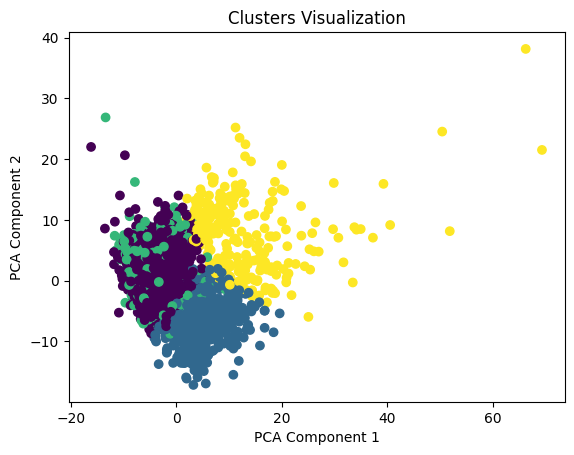

In [ ]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Reduce dimensions for visualization
pca = PCA(n_components=2)
pca_data = pca.fit_transform(encoded_data)

plt.scatter(pca_data[:, 0], pca_data[:, 1], c=y_pred)
plt.title("Clusters Visualization")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.show()


In [ ]:
# Calculate cluster profile
cluster_profile = data_deep.drop(columns='visit_occurrence_id').groupby('cluster').agg(['mean', 'median', 'std'])
cluster_profile = pd.DataFrame(cluster_profile)
cluster_profile

urine_output_per_kg_avg_roll_6hr               \
                                    mean median   std   
cluster                                                 
0                                  1.152  1.093 0.628   
1                                  0.379  0.241 0.384   
2                                  1.098  1.070 0.456   
3                                  0.891  0.929 0.527   

        urine_output_per_kg_avg_roll_12hr               \
                                     mean median   std   
cluster                                                  
0                                   1.147  1.089 0.644   
1                                   0.381  0.250 0.378   
2                                   1.083  1.048 0.453   
3                                   0.890  0.918 0.527   

        urine_output_per_kg_avg_roll_24hr              highest_scr          \
                                     mean median   std        mean  median   
cluster                                                                      
0                                   1.132  1.063 0.679     205.208 180.000   
1                                   0.384  0.252 0.369     354.322 329.000   
2                                   1.052  1.008 0.449     214.082 184.500   
3                                   0.884  0.892 0.525     257.682 252.500   

                first_scr                is_medical_admission               \
            std      mean  median    std                 mean median   std   
cluster                                                                      
0       101.783   113.770 102.000 57.765                0.229  0.000 0.420   
1       175.021   180.216 146.000 99.352                0.249  0.000 0.433   
2       110.528   117.388 103.000 68.396                0.194  0.000 0.396   
3       113.817   125.091 104.000 71.465                0.129  0.000 0.336   

        is_planned_surgery_admission               \
                                mean median   std   
cluster                                             
0                              0.020  0.000 0.140   
1                              0.016  0.000 0.127   
2                              0.314  0.000 0.465   
3                              0.038  0.000 0.191   

        is_emergency_surgery_admission              is_acute_admission         \
                                  mean median   std               mean median   
cluster                                                                         
0                                0.093  0.000 0.291              0.066  0.000   
1                                0.079  0.000 0.270              0.100  0.000   
2                                0.128  0.000 0.335              0.019  0.000   
3                                0.053  0.000 0.225              0.083  0.000   

              is_elective_admission              is_deceased_before_admission  \
          std                  mean median   std                         mean   
cluster                                                                         
0       0.248                 0.012  0.000 0.109                        0.000   
1       0.301                 0.018  0.000 0.134                        0.000   
2       0.137                 0.016  0.000 0.127                        0.000   
3       0.277                 0.015  0.000 0.122                        0.000   

                     is_type_1_diabetes              is_hypertension         \
        median   std               mean median   std            mean median   
cluster                                                                       
0        0.000 0.000              0.000  0.000 0.000           0.000  0.000   
1        0.000 0.000              0.000  0.000 0.000           0.000  0.000   
2        0.000 0.000              0.000  0.000 0.000           0.000  0.000   
3        0.000 0.000              0.000  0.000 0.000           0.000  0.000   

              is_coronary_artery_disease     

In [ ]:
cluster_profile.to_csv('cluster_profile_agg_autoencoder_tuned.csv', index=False)

In [ ]:
data_deep.to_csv('cluster_profile_original_autoencoder_tuned.csv', index=False)

In [ ]:
cluster_summary_count = data_deep['cluster'].value_counts()
print("Cluster sizes:")
print(cluster_summary_count)

Cluster sizes:
cluster
0    1158
1     607
2     366
3     264
Name: count, dtype: int64


In [ ]:
from sklearn.metrics import silhouette_score

# Calculate silhouette score
score = silhouette_score(encoded_data, y_pred)
print(f"Silhouette Score: {score}")


Silhouette Score: 0.1536991149187088


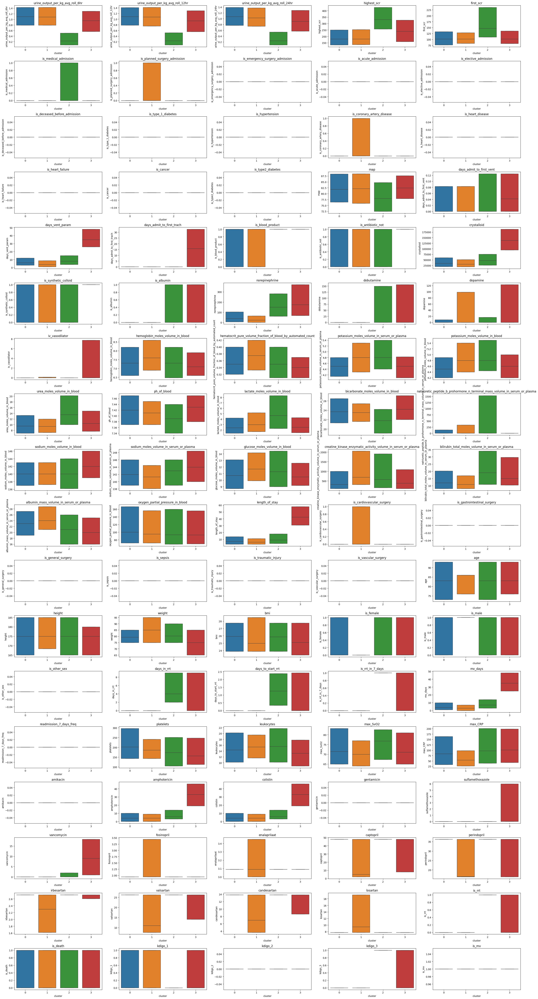

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define your color palette for the clusters
palette = {"0": "C0", "1": "C1", "2": "C2", "3": "C3"}

# Convert cluster labels to strings for consistency with the palette keys
data_deep['cluster'] = data_deep['cluster'].astype(str)

# Get the list of columns to plot, excluding 'visit_occurrence_id' and 'optimal_cluster'
cols = [col for col in data_deep.columns if col not in ['visit_occurrence_id', 'cluster']]

# Set up the matplotlib figure with increased height
plt.figure(figsize=(30, 60))  # Adjust the size as needed

# Create subplots for each variable
for i, variable in enumerate(cols):
    plt.subplot((len(cols) // 5) + 1, 5, i + 1)
    sns.boxplot(y=data_deep[variable], x=data_deep['cluster'], palette=palette, order=["0", "1", "2", "3"],
                showfliers=False, whis=0)
    plt.title(variable)
    plt.tight_layout()
    plt.legend([], [], frameon=False)  # Remove the legend

plt.savefig('box_plot_autoencoder_tuned.png')
plt.show()

## Variational Autoencoders

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import numpy as np

# Preprocess data
X = data_deep.drop(columns=['visit_occurrence_id']).values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Lambda
from tensorflow.keras.models import Model
from tensorflow.keras.losses import mse

# Define VAE parameters
input_dim = X_scaled.shape[1]
latent_dim = 10  # Dimension of the latent space

# Encoder
inputs = Input(shape=(input_dim,))
h = Dense(64, activation='relu')(inputs)
z_mean = Dense(latent_dim)(h)
z_log_var = Dense(latent_dim)(h)

# Sampling function
def sampling(args):
    z_mean, z_log_var = args
    batch = tf.shape(z_mean)[0]
    dim = tf.shape(z_mean)[1]
    epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
    return z_mean + tf.exp(0.5 * z_log_var) * epsilon

z = Lambda(sampling, output_shape=(latent_dim,))([z_mean, z_log_var])

# Decoder
decoder_h = Dense(64, activation='relu')
decoder_mean = Dense(input_dim, activation='sigmoid')
h_decoded = decoder_h(z)
x_decoded_mean = decoder_mean(h_decoded)

# VAE model
vae = Model(inputs, x_decoded_mean)

# VAE loss
reconstruction_loss = mse(inputs, x_decoded_mean)
reconstruction_loss *= input_dim
kl_loss = 1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var)
kl_loss = tf.reduce_sum(kl_loss, axis=-1)
kl_loss *= -0.5
vae_loss = tf.reduce_mean(reconstruction_loss + kl_loss)

vae.add_loss(vae_loss)
vae.compile(optimizer='adam')

# Summary of the VAE
vae.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 90)]                 0         []                            
                                                                                                  
 dense (Dense)               (None, 64)                   5824      ['input_1[0][0]']             
                                                                                                  
 dense_1 (Dense)             (None, 10)                   650       ['dense[0][0]']               
                                                                                                  
 dense_2 (Dense)             (None, 10)                   650       ['dense[0][0]']               
                                                                                              

In [ ]:
# Train the VAE
vae.fit(X_scaled, epochs=100, batch_size=256, shuffle=True, validation_split=0.2)

Epoch 1/100
8/8 [==============================] - 1s 25ms/step - loss: 117.0529 - val_loss: 107.5041
Epoch 2/100
8/8 [==============================] - 0s 6ms/step - loss: 110.3098 - val_loss: 103.7329
Epoch 3/100
8/8 [==============================] - 0s 6ms/step - loss: 107.7909 - val_loss: 100.6341
Epoch 4/100
8/8 [==============================] - 0s 7ms/step - loss: 103.4751 - val_loss: 97.9710
Epoch 5/100
8/8 [==============================] - 0s 7ms/step - loss: 101.3023 - val_loss: 95.6286
Epoch 6/100
8/8 [==============================] - 0s 7ms/step - loss: 99.1109 - val_loss: 93.1882
Epoch 7/100
8/8 [==============================] - 0s 7ms/step - loss: 95.7862 - val_loss: 91.3195
Epoch 8/100
8/8 [==============================] - 0s 7ms/step - loss: 93.6957 - val_loss: 89.3933
Epoch 9/100
8/8 [==============================] - 0s 6ms/step - loss: 93.3646 - val_loss: 87.8676
Epoch 10/100
8/8 [==============================] - 0s 6ms/step - loss: 91.8054 - val_loss: 86.8107


In [ ]:
# Encoder model
encoder = Model(inputs, z_mean)

# Get encoded data
encoded_data = encoder.predict(X_scaled)


75/75 [==============================] - 0s 1ms/step


In [ ]:
from sklearn.cluster import KMeans

# Perform K-Means clustering on the encoded data
n_clusters = 4  # Number of clusters you want
kmeans = KMeans(n_clusters=n_clusters)
y_pred = kmeans.fit_predict(encoded_data)

# Add cluster labels to original data
data_deep['cluster'] = y_pred


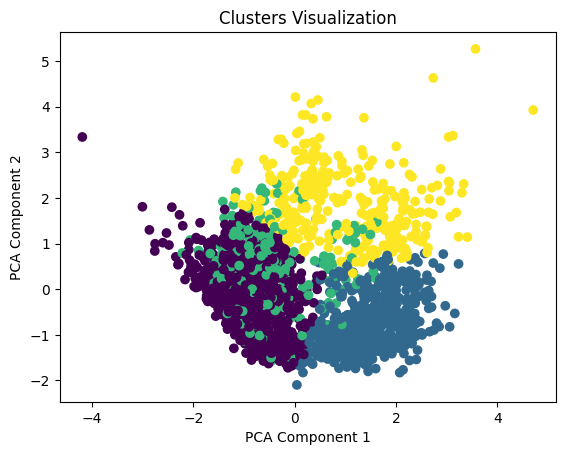

In [ ]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Reduce dimensions for visualization
pca = PCA(n_components=2)
pca_data = pca.fit_transform(encoded_data)

plt.scatter(pca_data[:, 0], pca_data[:, 1], c=y_pred)
plt.title("Clusters Visualization")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.show()


In [ ]:
# Calculate cluster profile
cluster_profile = data_deep.drop(columns='visit_occurrence_id').groupby('cluster').agg(['mean', 'median', 'std'])
cluster_profile = pd.DataFrame(cluster_profile)
cluster_profile

urine_output_per_kg_avg_roll_6hr               \
                                    mean median   std   
cluster                                                 
0                                  1.141  1.085 0.621   
1                                  0.373  0.240 0.379   
2                                  1.096  1.070 0.461   
3                                  0.950  0.940 0.586   

        urine_output_per_kg_avg_roll_12hr               \
                                     mean median   std   
cluster                                                  
0                                   1.135  1.079 0.631   
1                                   0.375  0.249 0.374   
2                                   1.082  1.049 0.459   
3                                   0.951  0.926 0.609   

        urine_output_per_kg_avg_roll_24hr              highest_scr          \
                                     mean median   std        mean  median   
cluster                                                                      
0                                   1.118  1.053 0.659     205.145 181.000   
1                                   0.378  0.249 0.365     359.618 333.500   
2                                   1.054  1.013 0.452     210.938 183.000   
3                                   0.946  0.903 0.643     249.742 243.000   

                first_scr                 is_medical_admission               \
            std      mean  median     std                 mean median   std   
cluster                                                                       
0       100.231   114.366 102.000  57.817                0.223  0.000 0.416   
1       178.490   183.681 147.500 104.049                0.256  0.000 0.437   
2       101.810   115.517 104.000  55.339                0.211  0.000 0.409   
3       114.013   120.221 102.000  67.926                0.138  0.000 0.345   

        is_planned_surgery_admission               \
                                mean median   std   
cluster                                             
0                              0.019  0.000 0.136   
1                              0.015  0.000 0.123   
2                              0.328  0.000 0.470   
3                              0.031  0.000 0.173   

        is_emergency_surgery_admission              is_acute_admission         \
                                  mean median   std               mean median   
cluster                                                                         
0                                0.105  0.000 0.306              0.063  0.000   
1                                0.085  0.000 0.279              0.102  0.000   
2                                0.086  0.000 0.281              0.019  0.000   
3                                0.058  0.000 0.235              0.086  0.000   

              is_elective_admission              is_deceased_before_admission  \
          std                  mean median   std                         mean   
cluster                                                                         
0       0.244                 0.013  0.000 0.115                        0.000   
1       0.303                 0.019  0.000 0.135                        0.000   
2       0.138                 0.014  0.000 0.117                        0.000   
3       0.281                 0.012  0.000 0.110                        0.000   

                     is_type_1_diabetes              is_hypertension         \
        median   std               mean median   std            mean median   
cluster                                                                       
0        0.000 0.000              0.000  0.000 0.000           0.000  0.000   
1        0.000 0.000              0.000  0.000 0.000           0.000  0.000   
2        0.000 0.000              0.000  0.000 0.000           0.000  0.000   
3        0.000 0.000              0.000  0.000 0.000           0.000  0.000   

              is_coronary_artery_disea

In [ ]:
cluster_summary_count = data_deep['cluster'].value_counts()
print("Cluster sizes:")
print(cluster_summary_count)

Cluster sizes:
cluster
0    1119
1     590
2     360
3     326
Name: count, dtype: int64


In [ ]:
from sklearn.metrics import silhouette_score

# Calculate silhouette score
score = silhouette_score(encoded_data, y_pred)
print(f"Silhouette Score: {score}")


Silhouette Score: 0.33262431621551514


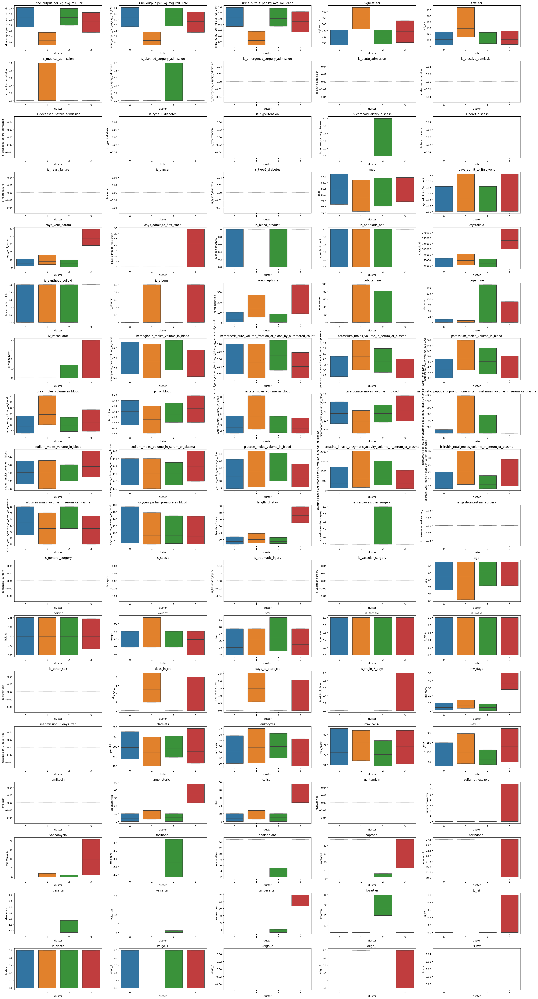

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define your color palette for the clusters
palette = {"0": "C0", "1": "C1", "2": "C2", "3": "C3"}

# Convert cluster labels to strings for consistency with the palette keys
data_deep['cluster'] = data_deep['cluster'].astype(str)

# Get the list of columns to plot, excluding 'visit_occurrence_id' and 'optimal_cluster'
cols = [col for col in data_deep.columns if col not in ['visit_occurrence_id', 'cluster']]

# Set up the matplotlib figure with increased height
plt.figure(figsize=(30, 60))  # Adjust the size as needed

# Create subplots for each variable
for i, variable in enumerate(cols):
    plt.subplot((len(cols) // 5) + 1, 5, i + 1)
    sns.boxplot(y=data_deep[variable], x=data_deep['cluster'], palette=palette, order=["0", "1", "2", "3"],
                showfliers=False, whis=0)
    plt.title(variable)
    plt.tight_layout()
    plt.legend([], [], frameon=False)  # Remove the legend

#plt.savefig('box_plot_git.png')
plt.show()

## ClusterGAN

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Flatten, Reshape, LeakyReLU, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Preprocess data
X = data_deep.drop(columns=['visit_occurrence_id']).values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
def build_generator(latent_dim, output_dim):
    model = tf.keras.Sequential([
        Dense(128, input_dim=latent_dim),
        LeakyReLU(alpha=0.2),
        BatchNormalization(momentum=0.8),
        Dense(256),
        LeakyReLU(alpha=0.2),
        BatchNormalization(momentum=0.8),
        Dense(512),
        LeakyReLU(alpha=0.2),
        BatchNormalization(momentum=0.8),
        Dense(output_dim, activation='tanh')
    ])
    return model

latent_dim = 10  # Dimension of the latent space
output_dim = X_scaled.shape[1]  # Dimension of the output space
generator = build_generator(latent_dim, output_dim)
generator.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5 (Dense)             (None, 128)               1408      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 128)               0         
                                                                 
 batch_normalization (Batch  (None, 128)               512       
 Normalization)                                                  
                                                                 
 dense_6 (Dense)             (None, 256)               33024     
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 256)               0         
                                                                 
 batch_normalization_1 (Bat  (None, 256)               1024      
 chNormalization)                                       

In [ ]:
def build_discriminator(input_dim):
    model = tf.keras.Sequential([
        Dense(512, input_dim=input_dim),
        LeakyReLU(alpha=0.2),
        Dense(256),
        LeakyReLU(alpha=0.2),
        Dense(1, activation='sigmoid')
    ])
    return model

discriminator = build_discriminator(output_dim)
discriminator.compile(loss='binary_crossentropy', optimizer=Adam(0.0002, 0.5), metrics=['accuracy'])
discriminator.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_9 (Dense)             (None, 512)               47104     
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 512)               0         
                                                                 
 dense_10 (Dense)            (None, 256)               131328    
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 256)               0         
                                                                 
 dense_11 (Dense)            (None, 1)                 257       
                                                                 
Total params: 178689 (698.00 KB)
Trainable params: 178689 (698.00 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
def build_encoder(input_dim, latent_dim):
    model = tf.keras.Sequential([
        Dense(512, input_dim=input_dim),
        LeakyReLU(alpha=0.2),
        Dense(256),
        LeakyReLU(alpha=0.2),
        Dense(latent_dim)
    ])
    return model

encoder = build_encoder(output_dim, latent_dim)
encoder.summary()


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_12 (Dense)            (None, 512)               47104     
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 512)               0         
                                                                 
 dense_13 (Dense)            (None, 256)               131328    
                                                                 
 leaky_re_lu_6 (LeakyReLU)   (None, 256)               0         
                                                                 
 dense_14 (Dense)            (None, 10)                2570      
                                                                 
Total params: 181002 (707.04 KB)
Trainable params: 181002 (707.04 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
# Freeze the discriminator during the adversarial training
discriminator.trainable = False

# GAN model combining encoder, generator, and discriminator
real_input = Input(shape=(output_dim,))
z = encoder(real_input)
fake_data = generator(z)
validity = discriminator(fake_data)

cluster_gan = Model(real_input, validity)
cluster_gan.compile(loss='binary_crossentropy', optimizer=Adam(0.0002, 0.5))
cluster_gan.summary()


Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 91)]              0         
                                                                 
 sequential_2 (Sequential)   (None, 10)                181002    
                                                                 
 sequential (Sequential)     (None, 91)                216283    
                                                                 
 sequential_1 (Sequential)   (None, 1)                 178689    
                                                                 
Total params: 575974 (2.20 MB)
Trainable params: 395493 (1.51 MB)
Non-trainable params: 180481 (705.00 KB)
_________________________________________________________________


In [ ]:
# Training parameters
epochs = 10000
batch_size = 64
sample_interval = 1000

# Real and fake labels
valid = np.ones((batch_size, 1))
fake = np.zeros((batch_size, 1))

# Training loop
for epoch in range(epochs):
    # Train Discriminator
    idx = np.random.randint(0, X_scaled.shape[0], batch_size)
    real_data = X_scaled[idx]

    z = np.random.normal(0, 1, (batch_size, latent_dim))
    fake_data = generator.predict(z)

    d_loss_real = discriminator.train_on_batch(real_data, valid)
    d_loss_fake = discriminator.train_on_batch(fake_data, fake)
    d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

    # Train Generator (via the combined model)
    g_loss = cluster_gan.train_on_batch(real_data, valid)

    # Print progress
    if epoch % sample_interval == 0:
        print(f"{epoch} [D loss: {d_loss[0]} | D acc.: {100*d_loss[1]}] [G loss: {g_loss}]")


Streaming output truncated to the last 5000 lines.
2/2 [==============================] - 0s 4ms/step
6000 [D loss: 0.00010632983813252395 | D acc.: 100.0] [G loss: 6.121292244642973e-05]
2/2 [==============================] - 0s 4ms/step
7000 [D loss: 0.0001790995229384862 | D acc.: 100.0] [G loss: 2.052818308584392e-05]
2/2 [==============================] - 0s 4ms/step
8000 [D loss: 0.004580248845741153 | D acc.: 100.0] [G loss: 0.021270379424095154]
2/2 [==============================] - 0s 5ms/step
9000 [D loss: 0.00029308206285350025 | D acc.: 100.0] [G loss: 0.0012681650696322322]
2/2 [==============================] - 0s 6ms/step


In [ ]:
def find_best_k(data, max_clusters):
    best_k = 2
    best_score = -1
    for k in range(2, max_clusters + 1):
        kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
        cluster_labels = kmeans.fit_predict(data)
        silhouette_avg = silhouette_score(data, cluster_labels)
        print(f'For n_clusters = {k}, the average silhouette_score is {silhouette_avg}')
        if silhouette_avg > best_score:
            best_score = silhouette_avg
            best_k = k
    return best_k


In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score

# Finding the best k using silhouette score
best_k = find_best_k(encoded_data, 10)
best_k

For n_clusters = 2, the average silhouette_score is 0.693884015083313
For n_clusters = 3, the average silhouette_score is 0.7040961980819702
For n_clusters = 4, the average silhouette_score is 0.7220473885536194
For n_clusters = 5, the average silhouette_score is 0.674263596534729
For n_clusters = 6, the average silhouette_score is 0.6661529541015625
For n_clusters = 7, the average silhouette_score is 0.6659519672393799
For n_clusters = 8, the average silhouette_score is 0.6666722297668457
For n_clusters = 9, the average silhouette_score is 0.6434575319290161
For n_clusters = 10, the average silhouette_score is 0.6380100250244141


4

75/75 [==============================] - 0s 2ms/step


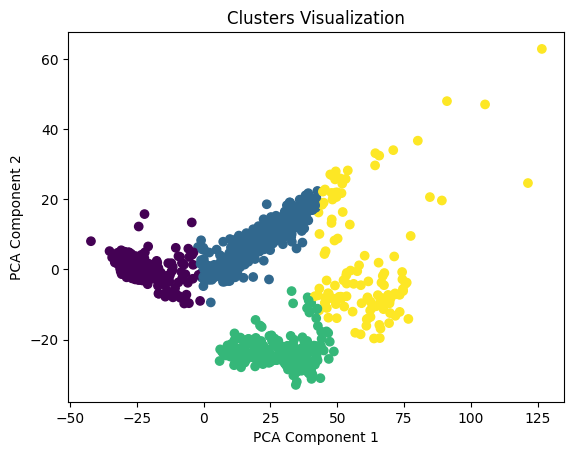

In [ ]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Get encoded data
encoded_data = encoder.predict(X_scaled)

# Perform K-Means clustering on the encoded data
n_clusters = 4  # Number of clusters you want
kmeans = KMeans(n_clusters=n_clusters)
y_pred = kmeans.fit_predict(encoded_data)

# Add cluster labels to original data
data_deep['cluster'] = y_pred

# Reduce dimensions for visualization
pca = PCA(n_components=2)
pca_data = pca.fit_transform(encoded_data)

plt.scatter(pca_data[:, 0], pca_data[:, 1], c=y_pred)
plt.title("Clusters Visualization")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.show()


In [ ]:
# Calculate cluster profile
cluster_profile = data_deep.drop(columns='visit_occurrence_id').groupby('cluster').agg(['mean', 'median', 'std'])
cluster_profile = pd.DataFrame(cluster_profile)
cluster_profile

urine_output_per_kg_avg_roll_6hr               \
                                    mean median   std   
cluster                                                 
0                                  1.168  1.097 0.566   
1                                  0.502  0.294 0.548   
2                                  1.190  1.187 0.427   
3                                  0.577  0.531 0.457   

        urine_output_per_kg_avg_roll_12hr               \
                                     mean median   std   
cluster                                                  
0                                   1.160  1.090 0.578   
1                                   0.505  0.307 0.555   
2                                   1.177  1.171 0.425   
3                                   0.577  0.531 0.454   

        urine_output_per_kg_avg_roll_24hr              highest_scr          \
                                     mean median   std        mean  median   
cluster                                                                      
0                                   1.142  1.065 0.608     191.300 172.000   
1                                   0.507  0.311 0.566     338.571 322.000   
2                                   1.148  1.138 0.420     198.802 175.500   
3                                   0.574  0.513 0.449     368.309 336.000   

                first_scr                is_medical_admission               \
            std      mean  median    std                 mean median   std   
cluster                                                                      
0        85.996   114.177 102.000 57.457                0.207  0.000 0.405   
1       131.584   161.390 131.000 96.140                0.223  0.000 0.417   
2        99.173   121.131 104.500 72.522                0.272  0.000 0.446   
3       279.992   149.120 123.000 86.600                0.168  0.000 0.375   

        is_planned_surgery_admission               \
                                mean median   std   
cluster                                             
0                              0.072  0.000 0.259   
1                              0.026  0.000 0.161   
2                              0.160  0.000 0.368   
3                              0.056  0.000 0.231   

        is_emergency_surgery_admission              is_acute_admission         \
                                  mean median   std               mean median   
cluster                                                                         
0                                0.096  0.000 0.295              0.066  0.000   
1                                0.086  0.000 0.280              0.095  0.000   
2                                0.090  0.000 0.286              0.022  0.000   
3                                0.072  0.000 0.260              0.040  0.000   

              is_elective_admission              is_deceased_before_admission  \
          std                  mean median   std                         mean   
cluster                                                                         
0       0.249                 0.012  0.000 0.111                        0.000   
1       0.293                 0.016  0.000 0.127                        0.000   
2       0.148                 0.019  0.000 0.136                        0.000   
3       0.197                 0.016  0.000 0.126                        0.000   

                     is_type_1_diabetes              is_hypertension         \
        median   std               mean median   std            mean median   
cluster                                                                       
0        0.000 0.000              0.000  0.000 0.000           0.000  0.000   
1        0.000 0.000              0.000  0.000 0.000           0.000  0.000   
2        0.000 0.000              0.000  0.000 0.000           0.000  0.000   
3        0.000 0.000              0.000  0.000 0.000           0.000  0.000   

              is_coronary_artery_disease     

In [ ]:
cluster_profile.to_csv('cluster_profile_GAN_aggregated.csv', index=False)

In [ ]:
data_deep.drop(columns='visit_occurrence_id').to_csv('cluster_profile_GAN_original.csv', index=False)

In [ ]:
cluster_summary_count = data_deep['cluster'].value_counts()
print("Cluster sizes:")
print(cluster_summary_count)

Cluster sizes:
cluster
0    1209
1     793
2     268
3     125
Name: count, dtype: int64


In [ ]:
from sklearn.metrics import silhouette_score

# Calculate silhouette score
score = silhouette_score(encoded_data, y_pred)
print(f"Silhouette Score: {score}")


Silhouette Score: 0.7220473885536194


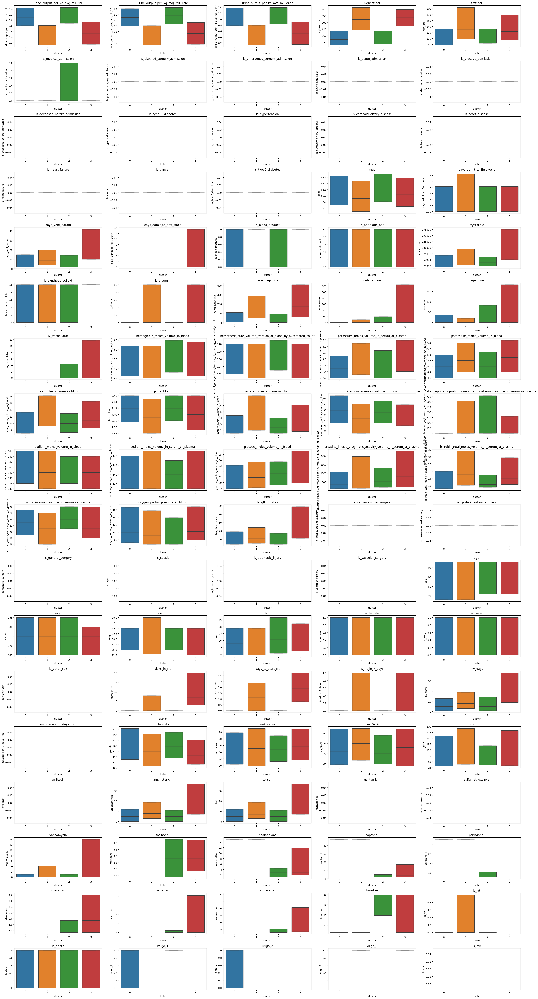

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define your color palette for the clusters
palette = {"0": "C0", "1": "C1", "2": "C2", "3": "C3"}

# Convert cluster labels to strings for consistency with the palette keys
data_deep['cluster'] = data_deep['cluster'].astype(str)

# Get the list of columns to plot, excluding 'visit_occurrence_id' and 'optimal_cluster'
cols = [col for col in data_deep.columns if col not in ['visit_occurrence_id', 'cluster']]

# Set up the matplotlib figure with increased height
plt.figure(figsize=(30, 60))  # Adjust the size as needed

# Create subplots for each variable
for i, variable in enumerate(cols):
    plt.subplot((len(cols) // 5) + 1, 5, i + 1)
    sns.boxplot(y=data_deep[variable], x=data_deep['cluster'], palette=palette, order=["0", "1", "2", "3"],
                showfliers=False, whis=0)
    plt.title(variable)
    plt.tight_layout()
    plt.legend([], [], frameon=False)  # Remove the legend

plt.savefig('box_plot_GAN.png')
plt.show()

## Deep Clustering Network

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Drop the ID column
X = data_deep.drop(columns=['visit_occurrence_id']).values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


In [ ]:
def build_autoencoder(input_dim, encoding_dim):
    input_layer = Input(shape=(input_dim,))
    encoder = Dense(128, activation='relu')(input_layer)
    encoder = Dense(64, activation='relu')(encoder)
    encoder_output = Dense(encoding_dim, activation='relu')(encoder)

    decoder = Dense(64, activation='relu')(encoder_output)
    decoder = Dense(128, activation='relu')(decoder)
    decoder_output = Dense(input_dim, activation='sigmoid')(decoder)

    autoencoder = Model(inputs=input_layer, outputs=decoder_output)
    encoder_model = Model(inputs=input_layer, outputs=encoder_output)

    autoencoder.compile(optimizer='adam', loss='mse')

    return autoencoder, encoder_model

input_dim = X_scaled.shape[1]
encoding_dim = 10
autoencoder, encoder = build_autoencoder(input_dim, encoding_dim)
autoencoder.summary()
encoder.summary()


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 90)]              0         
                                                                 
 dense (Dense)               (None, 128)               11648     
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dense_2 (Dense)             (None, 10)                650       
                                                                 
 dense_3 (Dense)             (None, 64)                704       
                                                                 
 dense_4 (Dense)             (None, 128)               8320      
                                                                 
 dense_5 (Dense)             (None, 90)                11610 

In [ ]:
autoencoder.fit(X_scaled, X_scaled, epochs=100, batch_size=256, shuffle=True, validation_split=0.2)

Epoch 1/100
8/8 [==============================] - 1s 27ms/step - loss: 1.1823 - val_loss: 1.0954
Epoch 2/100
8/8 [==============================] - 0s 8ms/step - loss: 1.0958 - val_loss: 0.9765
Epoch 3/100
8/8 [==============================] - 0s 8ms/step - loss: 0.9882 - val_loss: 0.9096
Epoch 4/100
8/8 [==============================] - 0s 8ms/step - loss: 0.9509 - val_loss: 0.9029
Epoch 5/100
8/8 [==============================] - 0s 9ms/step - loss: 0.9456 - val_loss: 0.8965
Epoch 6/100
8/8 [==============================] - 0s 8ms/step - loss: 0.9377 - val_loss: 0.8880
Epoch 7/100
8/8 [==============================] - 0s 9ms/step - loss: 0.9278 - val_loss: 0.8773
Epoch 8/100
8/8 [==============================] - 0s 8ms/step - loss: 0.9172 - val_loss: 0.8667
Epoch 9/100
8/8 [==============================] - 0s 8ms/step - loss: 0.9067 - val_loss: 0.8563
Epoch 10/100
8/8 [==============================] - 0s 8ms/step - loss: 0.8952 - val_loss: 0.8469
Epoch 11/100
8/8 [==========

In [ ]:
# Get encoded data
encoded_data = encoder.predict(X_scaled)

75/75 [==============================] - 0s 2ms/step


In [ ]:
def find_best_k(data, max_clusters):
    best_k = 2
    best_score = -1
    for k in range(2, max_clusters + 1):
        kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
        cluster_labels = kmeans.fit_predict(data)
        silhouette_avg = silhouette_score(data, cluster_labels)
        print(f'For n_clusters = {k}, the average silhouette_score is {silhouette_avg}')
        if silhouette_avg > best_score:
            best_score = silhouette_avg
            best_k = k
    return best_k


In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score

# Finding the best k using silhouette score
best_k = find_best_k(encoded_data, 10)
best_k

For n_clusters = 2, the average silhouette_score is 0.30336934328079224
For n_clusters = 3, the average silhouette_score is 0.20619021356105804
For n_clusters = 4, the average silhouette_score is 0.17970465123653412
For n_clusters = 5, the average silhouette_score is 0.1848624050617218
For n_clusters = 6, the average silhouette_score is 0.18385571241378784
For n_clusters = 7, the average silhouette_score is 0.1697683334350586
For n_clusters = 8, the average silhouette_score is 0.1533682942390442
For n_clusters = 9, the average silhouette_score is 0.14518415927886963
For n_clusters = 10, the average silhouette_score is 0.13292837142944336


2

In [ ]:
# Perform K-Means clustering on the encoded data
n_clusters = 3  # Number of clusters you want
kmeans = KMeans(n_clusters=n_clusters, n_init=20)
y_pred = kmeans.fit_predict(encoded_data)

# Add cluster labels to the encoded data
encoded_data_with_labels = np.hstack((encoded_data, y_pred.reshape(-1, 1)))


In [ ]:
def clustering_loss(features, cluster_centers, cluster_assignments, alpha=1.0):
    # Compute pairwise squared Euclidean distances between features and cluster centers
    distances = tf.reduce_sum(tf.square(tf.expand_dims(features, axis=1) - cluster_centers), axis=2)

    # Compute the clustering loss
    assignment_probabilities = tf.nn.softmax(-alpha * distances)
    loss = tf.reduce_mean(tf.reduce_sum(assignment_probabilities * distances, axis=1))

    return loss


In [ ]:
# Initialize cluster centers
cluster_centers = tf.Variable(kmeans.cluster_centers_, dtype=tf.float32)

# Define optimizer
optimizer = Adam(learning_rate=0.001)

# Training parameters
epochs = 100
batch_size = 256

# Training loop
for epoch in range(epochs):
    for i in range(0, X_scaled.shape[0], batch_size):
        x_batch = X_scaled[i:i + batch_size]

        with tf.GradientTape() as tape:
            encoded_batch = encoder(x_batch)
            reconstruction = autoencoder(x_batch)
            ae_loss = tf.reduce_mean(tf.square(x_batch - reconstruction))

            cl_loss = clustering_loss(encoded_batch, cluster_centers, y_pred)

            total_loss = ae_loss + cl_loss

        gradients = tape.gradient(total_loss, autoencoder.trainable_variables + [cluster_centers])
        optimizer.apply_gradients(zip(gradients, autoencoder.trainable_variables + [cluster_centers]))

    print(f'Epoch {epoch + 1}, Loss: {total_loss.numpy()}, AE Loss: {ae_loss.numpy()}, CL Loss: {cl_loss.numpy()}')


Epoch 1, Loss: 227.42938232421875, AE Loss: 0.770972490310669, CL Loss: 226.65841674804688
Epoch 2, Loss: 156.07516479492188, AE Loss: 0.7799716591835022, CL Loss: 155.29519653320312
Epoch 3, Loss: 114.35671997070312, AE Loss: 0.788412868976593, CL Loss: 113.56830596923828
Epoch 4, Loss: 85.04542541503906, AE Loss: 0.8030742406845093, CL Loss: 84.24234771728516
Epoch 5, Loss: 65.17975616455078, AE Loss: 0.8174654841423035, CL Loss: 64.36228942871094
Epoch 6, Loss: 53.70420837402344, AE Loss: 0.831038773059845, CL Loss: 52.8731689453125
Epoch 7, Loss: 46.007240295410156, AE Loss: 0.8398170471191406, CL Loss: 45.167423248291016
Epoch 8, Loss: 40.94263458251953, AE Loss: 0.8454985022544861, CL Loss: 40.097137451171875
Epoch 9, Loss: 37.01947021484375, AE Loss: 0.854972243309021, CL Loss: 36.16449737548828
Epoch 10, Loss: 33.56151580810547, AE Loss: 0.864107072353363, CL Loss: 32.697410583496094
Epoch 11, Loss: 30.521947860717773, AE Loss: 0.8697338104248047, CL Loss: 29.65221405029297
Epo

75/75 [==============================] - 0s 1ms/step


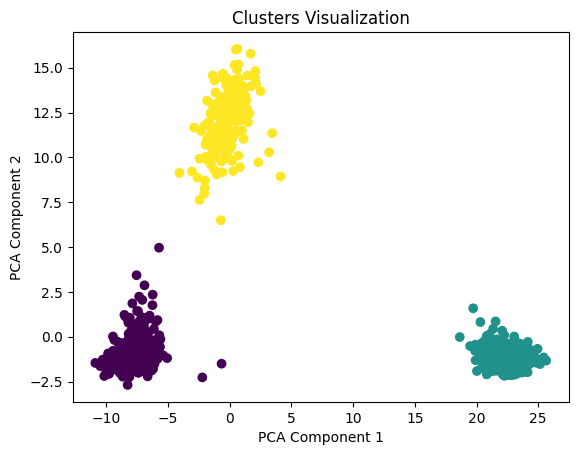

In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Get encoded data
encoded_data = encoder.predict(X_scaled)

# Perform K-Means clustering on the encoded data again after training
y_pred = kmeans.fit_predict(encoded_data)

# Add cluster labels to original data
data_deep['cluster'] = y_pred

# Reduce dimensions for visualization
pca = PCA(n_components=2)
pca_data = pca.fit_transform(encoded_data)

plt.scatter(pca_data[:, 0], pca_data[:, 1], c=y_pred)
plt.title("Clusters Visualization")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.show()


In [ ]:
# Calculate cluster profile
cluster_profile = data_deep.groupby('cluster').agg(['mean', 'median', 'std'])
cluster_profile = pd.DataFrame(cluster_profile)
cluster_profile

urine_output_per_kg_avg_roll_6hr               \
                                    mean median   std   
cluster                                                 
0                                  0.955  0.932 0.629   
1                                  1.060  1.055 0.566   
2                                  0.256  0.149 0.313   

        urine_output_per_kg_avg_roll_12hr               \
                                     mean median   std   
cluster                                                  
0                                   0.951  0.921 0.629   
1                                   1.052  1.042 0.592   
2                                   0.260  0.153 0.308   

        urine_output_per_kg_avg_roll_24hr              highest_scr          \
                                     mean median   std        mean  median   
cluster                                                                      
0                                   0.939  0.894 0.631     240.757 212.030   
1                                   1.033  1.005 0.645     242.453 205.000   
2                                   0.265  0.159 0.302     343.655 328.000   

                first_scr                 is_medical_admission               \
            std      mean  median     std                 mean median   std   
cluster                                                                       
0       124.724   125.728 110.000  70.517                0.193  0.000 0.395   
1       173.960   127.061 107.500  75.555                0.258  0.000 0.438   
2       129.466   198.680 176.000 109.504                0.297  0.000 0.458   

        is_planned_surgery_admission               \
                                mean median   std   
cluster                                             
0                              0.059  0.000 0.235   
1                              0.102  0.000 0.303   
2                              0.024  0.000 0.153   

        is_emergency_surgery_admission              is_acute_admission         \
                                  mean median   std               mean median   
cluster                                                                         
0                                0.085  0.000 0.280              0.071  0.000   
1                                0.098  0.000 0.298              0.044  0.000   
2                                0.110  0.000 0.314              0.129  0.000   

              is_elective_admission              is_deceased_before_admission  \
          std                  mean median   std                         mean   
cluster                                                                         
0       0.256                 0.011  0.000 0.105                        0.000   
1       0.205                 0.012  0.000 0.110                        0.000   
2       0.336                 0.048  0.000 0.214                        0.000   

                     is_type_1_diabetes              is_hypertension         \
        median   std               mean median   std            mean median   
cluster                                                                       
0        0.000 0.000              0.000  0.000 0.000           0.000  0.000   
1        0.000 0.000              0.000  0.000 0.000           0.000  0.000   
2        0.000 0.000              0.000  0.000 0.000           0.000  0.000   

              is_coronary_artery_disease              is_heart_disease         \
          std                       mean median   std             mean median   
cluster                                                                         
0       0.000                      0.071  0.000 0.256            0.000  0.000   
1       0.000                      0.160  0.000 0.367            0.000  0.000   
2       0.000                      0.038  0.000 0.192            0.000  0.000   

              is_heart_failure              is_cancer               \
          std             mean median   std    

In [ ]:
cluster_profile.to_csv('cluster_profile_DCN_aggregated.csv', index=False)

In [ ]:
data_deep.to_csv('cluster_profile_DCN_original.csv', index=False)

In [ ]:
cluster_summary_count = data_deep['cluster'].value_counts()
print("Cluster sizes:")
print(cluster_summary_count)

Cluster sizes:
cluster
0    1616
1     570
2     209
Name: count, dtype: int64


In [ ]:
from sklearn.metrics import silhouette_score

# Calculate silhouette score
score = silhouette_score(encoded_data, y_pred)
print(f"Silhouette Score: {score}")


Silhouette Score: 0.9097115993499756


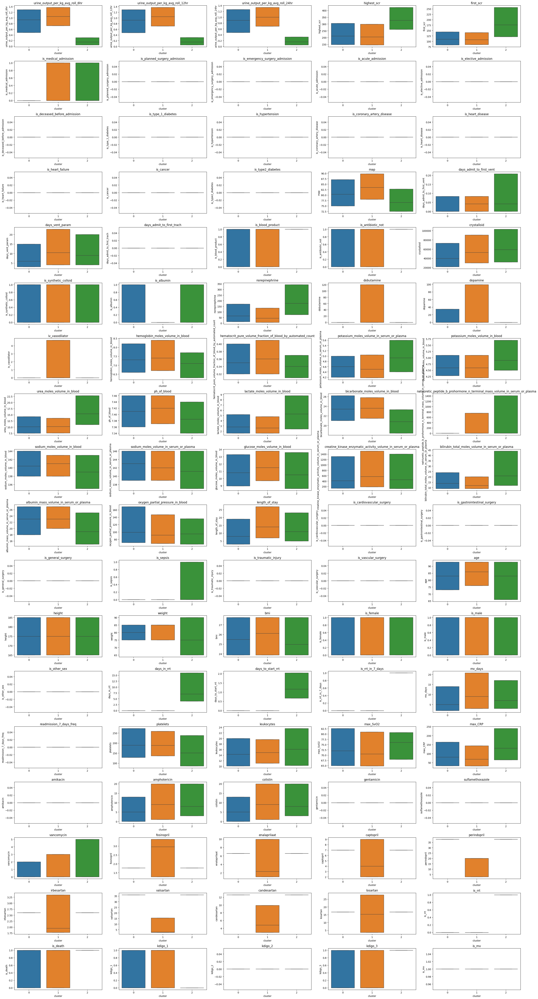

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define your color palette for the clusters
palette = {"0": "C0", "1": "C1", "2": "C2"}

# Convert cluster labels to strings for consistency with the palette keys
data_deep['cluster'] = data_deep['cluster'].astype(str)

# Get the list of columns to plot, excluding 'visit_occurrence_id' and 'optimal_cluster'
cols = [col for col in data_deep.columns if col not in ['cluster']]

# Set up the matplotlib figure with increased height
plt.figure(figsize=(30, 60))  # Adjust the size as needed

# Create subplots for each variable
for i, variable in enumerate(cols):
    plt.subplot((len(cols) // 5) + 1, 5, i + 1)
    sns.boxplot(y=data_deep[variable], x=data_deep['cluster'], palette=palette, order=["0", "1", "2"],
                showfliers=False, whis=0)
    plt.title(variable)
    plt.tight_layout()
    plt.legend([], [], frameon=False)  # Remove the legend

plt.savefig('box_plot_DCN.png')
plt.show()

## Deep Clustering Network (tuned, K=4)

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Drop the ID column
X = data_deep.drop(columns=['visit_occurrence_id']).values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


In [ ]:
from tensorflow.keras.layers import Dropout

def build_autoencoder(input_dim, encoding_dim):
    input_layer = Input(shape=(input_dim,))
    encoder = Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(input_layer)
    encoder = Dropout(0.5)(encoder)
    encoder = Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(encoder)
    encoder = Dropout(0.5)(encoder)
    encoder = Dense(64, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(encoder)
    encoder_output = Dense(encoding_dim, activation='relu')(encoder)

    decoder = Dense(64, activation='relu')(encoder_output)
    decoder = Dense(128, activation='relu')(decoder)
    decoder = Dense(256, activation='relu')(decoder)
    decoder_output = Dense(input_dim, activation='sigmoid')(decoder)

    autoencoder = Model(inputs=input_layer, outputs=decoder_output)
    encoder_model = Model(inputs=input_layer, outputs=encoder_output)

    autoencoder.compile(optimizer='adam', loss='mse')

    return autoencoder, encoder_model

input_dim = X_scaled.shape[1]
encoding_dim = 10
autoencoder, encoder = build_autoencoder(input_dim, encoding_dim)
autoencoder.summary()
encoder.summary()


Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 91)]              0         
                                                                 
 dense_16 (Dense)            (None, 256)               23552     
                                                                 
 dropout_2 (Dropout)         (None, 256)               0         
                                                                 
 dense_17 (Dense)            (None, 128)               32896     
                                                                 
 dropout_3 (Dropout)         (None, 128)               0         
                                                                 
 dense_18 (Dense)            (None, 64)                8256      
                                                                 
 dense_19 (Dense)            (None, 10)                650 

In [ ]:
autoencoder.fit(X_scaled, X_scaled, epochs=100, batch_size=256, shuffle=True, validation_split=0.2)

Epoch 1/100
8/8 [==============================] - 1s 28ms/step - loss: 4.8139 - val_loss: 4.3745
Epoch 2/100
8/8 [==============================] - 0s 11ms/step - loss: 4.1199 - val_loss: 3.6808
Epoch 3/100
8/8 [==============================] - 0s 10ms/step - loss: 3.4875 - val_loss: 3.1513
Epoch 4/100
8/8 [==============================] - 0s 11ms/step - loss: 3.0289 - val_loss: 2.7449
Epoch 5/100
8/8 [==============================] - 0s 12ms/step - loss: 2.6479 - val_loss: 2.4009
Epoch 6/100
8/8 [==============================] - 0s 12ms/step - loss: 2.3288 - val_loss: 2.1164
Epoch 7/100
8/8 [==============================] - 0s 10ms/step - loss: 2.0661 - val_loss: 1.8834
Epoch 8/100
8/8 [==============================] - 0s 12ms/step - loss: 1.8512 - val_loss: 1.6928
Epoch 9/100
8/8 [==============================] - 0s 11ms/step - loss: 1.6757 - val_loss: 1.5372
Epoch 10/100
8/8 [==============================] - 0s 11ms/step - loss: 1.5326 - val_loss: 1.4106
Epoch 11/100
8/8 [=

In [ ]:
# Get encoded data
encoded_data = encoder.predict(X_scaled)

75/75 [==============================] - 0s 2ms/step


In [ ]:
def find_best_k(data, max_clusters):
    best_k = 2
    best_score = -1
    for k in range(2, max_clusters + 1):
        kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
        cluster_labels = kmeans.fit_predict(data)
        silhouette_avg = silhouette_score(data, cluster_labels)
        print(f'For n_clusters = {k}, the average silhouette_score is {silhouette_avg}')
        if silhouette_avg > best_score:
            best_score = silhouette_avg
            best_k = k
    return best_k


In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score

# Finding the best k using silhouette score
best_k = find_best_k(encoded_data, 10)
best_k

For n_clusters = 2, the average silhouette_score is 0.6981501579284668
For n_clusters = 3, the average silhouette_score is 0.6594301462173462
For n_clusters = 4, the average silhouette_score is 0.5997557044029236
For n_clusters = 5, the average silhouette_score is 0.5728444457054138
For n_clusters = 6, the average silhouette_score is 0.5727161765098572
For n_clusters = 7, the average silhouette_score is 0.5709189176559448
For n_clusters = 8, the average silhouette_score is 0.5643162131309509
For n_clusters = 9, the average silhouette_score is 0.5567600727081299
For n_clusters = 10, the average silhouette_score is 0.5581000447273254


2

In [ ]:
# Perform K-Means clustering on the encoded data
n_clusters = 4
kmeans = KMeans(n_clusters=n_clusters, n_init=20)
y_pred = kmeans.fit_predict(encoded_data)

# Add cluster labels to the encoded data
encoded_data_with_labels = np.hstack((encoded_data, y_pred.reshape(-1, 1)))


In [ ]:
def clustering_loss(features, cluster_centers, alpha=1.0):
    # Compute pairwise squared Euclidean distances between features and cluster centers
    distances = tf.reduce_sum(tf.square(tf.expand_dims(features, axis=1) - cluster_centers), axis=2)

    # Compute the clustering loss
    assignment_probabilities = tf.nn.softmax(-alpha * distances)
    loss = tf.reduce_mean(tf.reduce_sum(assignment_probabilities * distances, axis=1))

    return loss

15/15 [==============================] - 0s 2ms/step
Epoch 1, Loss: 0.915075957775116, Val Loss: 0.850239745087673, AE Loss: 0.8448423456658917, CL Loss: 0.0053973994217813015
15/15 [==============================] - 0s 2ms/step
Epoch 2, Loss: 0.9047620296478271, Val Loss: 0.847471949678976, AE Loss: 0.8449069697290099, CL Loss: 0.002564979949966073
15/15 [==============================] - 0s 3ms/step
Epoch 3, Loss: 0.9039896130561829, Val Loss: 0.8498384817268744, AE Loss: 0.8482075137782886, CL Loss: 0.0016309679485857487
15/15 [==============================] - 0s 2ms/step
Epoch 4, Loss: 0.9009295105934143, Val Loss: 0.8489241484060419, AE Loss: 0.8474746103604791, CL Loss: 0.0014495380455628037
15/15 [==============================] - 0s 2ms/step
Epoch 5, Loss: 0.8996602892875671, Val Loss: 0.8475299533058805, AE Loss: 0.8461760930552064, CL Loss: 0.0013538602506741881
15/15 [==============================] - 0s 2ms/step
Epoch 6, Loss: 0.8988415002822876, Val Loss: 0.84870324169864

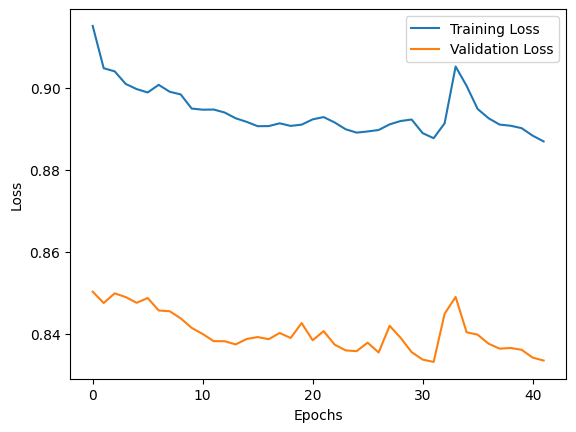

In [ ]:
from sklearn.model_selection import train_test_split

# Define a validation set
X_train, X_val = train_test_split(X_scaled, test_size=0.2, random_state=42)

# Initialize cluster centers
cluster_centers = tf.Variable(kmeans.cluster_centers_, dtype=tf.float32)

# Define optimizer
optimizer = Adam(learning_rate=0.001)

# Training parameters
epochs = 200
batch_size = 128
patience = 10  # Number of epochs to wait for improvement before stopping

# Early stopping variables
best_loss = float('inf')
wait = 0

# Initialize lists to store losses
losses = []
val_losses = []

# Training loop
for epoch in range(epochs):
    epoch_losses = []
    for i in range(0, X_train.shape[0], batch_size):
        x_batch = X_train[i:i + batch_size]

        with tf.GradientTape() as tape:
            encoded_batch = encoder(x_batch)
            reconstruction = autoencoder(x_batch)
            ae_loss = tf.reduce_mean(tf.square(x_batch - reconstruction))

            cl_loss = clustering_loss(encoded_batch, cluster_centers)

            total_loss = ae_loss + cl_loss

        gradients = tape.gradient(total_loss, autoencoder.trainable_variables + [cluster_centers])
        optimizer.apply_gradients(zip(gradients, autoencoder.trainable_variables + [cluster_centers]))

        epoch_losses.append(total_loss.numpy())

    # Calculate validation loss
    val_encoded = encoder.predict(X_val)
    val_reconstruction = autoencoder.predict(X_val)
    val_ae_loss = np.mean(np.square(X_val - val_reconstruction))
    val_cl_loss = clustering_loss(tf.constant(val_encoded, dtype=tf.float32), cluster_centers).numpy()
    val_total_loss = val_ae_loss + val_cl_loss

    print(f'Epoch {epoch + 1}, Loss: {np.mean(epoch_losses)}, Val Loss: {val_total_loss}, AE Loss: {val_ae_loss}, CL Loss: {val_cl_loss}')

    # Store the losses for plotting
    losses.append(np.mean(epoch_losses))
    val_losses.append(val_total_loss)

    # Early stopping check
    if val_total_loss < best_loss:
        best_loss = val_total_loss
        wait = 0
    else:
        wait += 1
        if wait >= patience:
            print("Early stopping...")
            break

# Plot the losses
plt.plot(losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


75/75 [==============================] - 0s 2ms/step


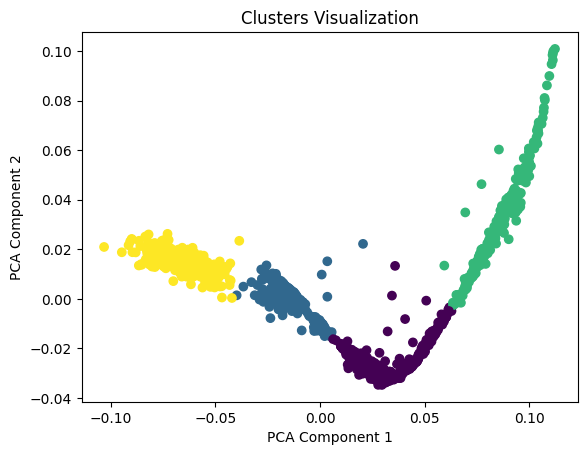

In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Get encoded data
encoded_data = encoder.predict(X_scaled)

# Perform K-Means clustering on the encoded data again after training
y_pred = kmeans.fit_predict(encoded_data)

# Add cluster labels to original data
data_deep['cluster'] = y_pred

# Reduce dimensions for visualization
pca = PCA(n_components=2)
pca_data = pca.fit_transform(encoded_data)

plt.scatter(pca_data[:, 0], pca_data[:, 1], c=y_pred)
plt.title("Clusters Visualization")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.show()


In [ ]:
# Calculate cluster profile
cluster_profile = data_deep.drop(columns='visit_occurrence_id').groupby('cluster').agg(['mean', 'median', 'std'])
cluster_profile = pd.DataFrame(cluster_profile)
cluster_profile

urine_output_per_kg_avg_roll_6hr               \
                                    mean median   std   
cluster                                                 
0                                  0.428  0.263 0.482   
1                                  1.085  1.024 0.622   
2                                  0.825  0.876 0.523   
3                                  1.237  1.234 0.435   

        urine_output_per_kg_avg_roll_12hr               \
                                     mean median   std   
cluster                                                  
0                                   0.432  0.272 0.497   
1                                   1.079  1.011 0.632   
2                                   0.824  0.862 0.519   
3                                   1.223  1.220 0.433   

        urine_output_per_kg_avg_roll_24hr              highest_scr          \
                                     mean median   std        mean  median   
cluster                                                                      
0                                   0.436  0.283 0.517     349.367 326.000   
1                                   1.064  1.003 0.658     212.052 185.240   
2                                   0.817  0.847 0.513     266.259 260.000   
3                                   1.193  1.184 0.429     202.732 174.500   

                first_scr                 is_medical_admission               \
            std      mean  median     std                 mean median   std   
cluster                                                                       
0       177.122   180.435 145.000 103.045                0.235  0.000 0.425   
1       106.596   116.387 103.000  59.835                0.211  0.000 0.408   
2       118.547   121.184 104.000  65.584                0.142  0.000 0.349   
3       105.111   115.272 102.000  62.516                0.264  0.000 0.441   

        is_planned_surgery_admission               \
                                mean median   std   
cluster                                             
0                              0.024  0.000 0.153   
1                              0.069  0.000 0.254   
2                              0.050  0.000 0.218   
3                              0.135  0.000 0.342   

        is_emergency_surgery_admission              is_acute_admission         \
                                  mean median   std               mean median   
cluster                                                                         
0                                0.080  0.000 0.272              0.102  0.000   
1                                0.093  0.000 0.290              0.063  0.000   
2                                0.057  0.000 0.233              0.069  0.000   
3                                0.124  0.000 0.330              0.036  0.000   

              is_elective_admission              is_deceased_before_admission  \
          std                  mean median   std                         mean   
cluster                                                                         
0       0.303                 0.019  0.000 0.136                        0.000   
1       0.244                 0.013  0.000 0.112                        0.000   
2       0.254                 0.023  0.000 0.150                        0.000   
3       0.186                 0.008  0.000 0.091                        0.000   

                     is_type_1_diabetes              is_hypertension         \
        median   std               mean median   std            mean median   
cluster                                                                       
0        0.000 0.000              0.000  0.000 0.000           0.000  0.000   
1        0.000 0.000              0.000  0.000 0.000           0.000  0.000   
2        0.000 0.000              0.000  0.000 0.000           0.000  0.000   
3        0.000 0.000              0.000  0.000 0.000           0.000  0.000   

              is_coronary_artery_disea

In [ ]:
cluster_profile.to_csv('cluster_profile_DCN_tuned_aggregated.csv', index=False)

In [ ]:
data_deep.drop(columns='visit_occurrence_id').to_csv('cluster_profile_DCN_tuned_original.csv', index=False)

In [ ]:
cluster_summary_count = data_deep['cluster'].value_counts()
print("Cluster sizes:")
print(cluster_summary_count)

Cluster sizes:
cluster
1    1184
0     586
3     364
2     261
Name: count, dtype: int64


In [ ]:
from sklearn.metrics import silhouette_score

# Calculate silhouette score
score = silhouette_score(encoded_data, y_pred)
print(f"Silhouette Score: {score}")


Silhouette Score: 0.6837700605392456


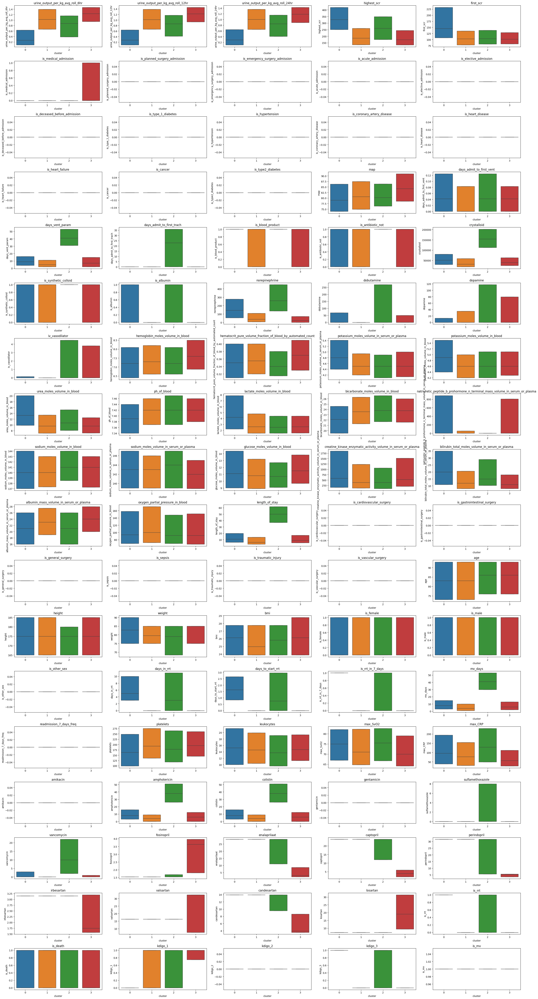

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define your color palette for the clusters
palette = {"0": "C0", "1": "C1", "2": "C2", "3": "C3"}

# Convert cluster labels to strings for consistency with the palette keys
data_deep['cluster'] = data_deep['cluster'].astype(str)

# Get the list of columns to plot, excluding 'visit_occurrence_id' and 'optimal_cluster'
cols = [col for col in data_deep.columns if col not in ['visit_occurrence_id', 'cluster']]

# Set up the matplotlib figure with increased height
plt.figure(figsize=(30, 60))  # Adjust the size as needed

# Create subplots for each variable
for i, variable in enumerate(cols):
    plt.subplot((len(cols) // 5) + 1, 5, i + 1)
    sns.boxplot(y=data_deep[variable], x=data_deep['cluster'], palette=palette, order=["0", "1", "2", "3"],
                showfliers=False, whis=0)
    plt.title(variable)
    plt.tight_layout()
    plt.legend([], [], frameon=False)  # Remove the legend

plt.savefig('box_plot_DCN_tuned.png')
plt.show()